In [25]:
import sys
import os
src_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
if src_dir not in sys.path:
    sys.path.append(src_dir)

os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from scipy.interpolate import SmoothBivariateSpline
from scipy.signal import find_peaks_cwt
from scipy.optimize import curve_fit as cfit
from astropy.visualization import ZScaleInterval
import stdatamodels.jwst.datamodels as dm
from scipy.ndimage import rotate, sobel
import BetterBackgroundSubtractStep as BBSS
import utils
import importlib
from scipy import interpolate
from astropy.modeling.functional_models import Gaussian2D
from astropy.coordinates import Angle
from astropy import units as u
from astropy.stats import sigma_clip
from matplotlib.animation import FuncAnimation
from glob import glob
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Open Data

In [2]:
working_dir = "./mastDownload/JWST/CEERS-NIRSPEC-P5-PRISM-MSATA/"
path = working_dir + "jw01345063001_03101_00001_nrs2_srctype.fits"

In [590]:
slits = dm.open(path)
slit = slits[0]
for key in slit:
    if "pos" in key:
        print(key)


meta.observation.exposure_number
meta.visit.total_exposures
meta.target.proposer_name
meta.target.proposer_ra
meta.target.proposer_dec
meta.instrument.focus_position
meta.exposure.count
meta.exposure.prime_parallel
meta.exposure.type
meta.exposure.start_time
meta.exposure.start_time_mjd
meta.exposure.mid_time
meta.exposure.mid_time_mjd
meta.exposure.end_time
meta.exposure.end_time_mjd
meta.exposure.start_time_tdb
meta.exposure.mid_time_tdb
meta.exposure.end_time_tdb
meta.exposure.osf_file
meta.exposure.readpatt
meta.exposure.noutputs
meta.exposure.nints
meta.exposure.ngroups
meta.exposure.nframes
meta.exposure.frame_divisor
meta.exposure.groupgap
meta.exposure.drop_frames1
meta.exposure.drop_frames3
meta.exposure.nsamples
meta.exposure.sample_time
meta.exposure.frame_time
meta.exposure.group_time
meta.exposure.integration_time
meta.exposure.exposure_time
meta.exposure.effective_exposure_time
meta.exposure.duration
meta.exposure.elapsed_exposure_time
meta.exposure.nresets_at_start
meta.

# Failed fits

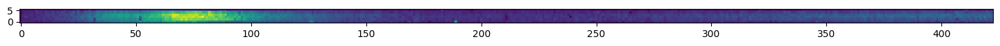

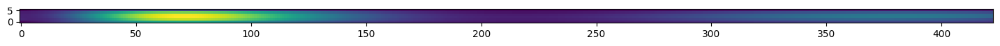

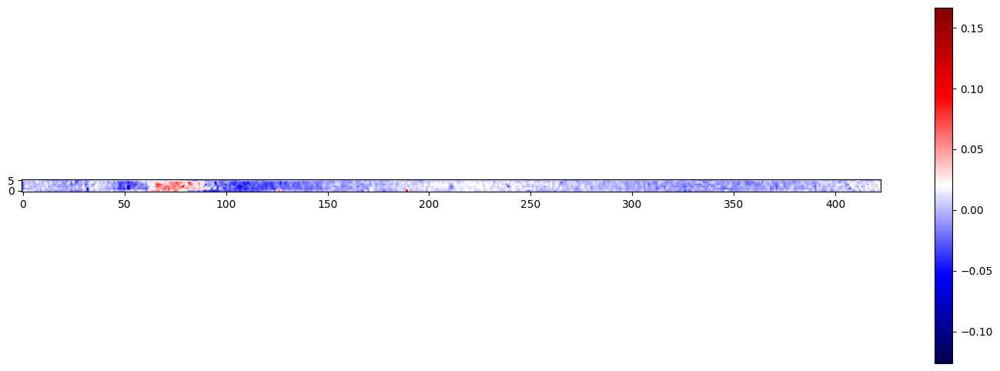

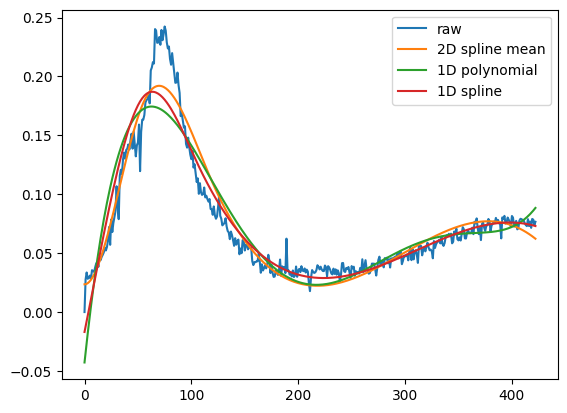

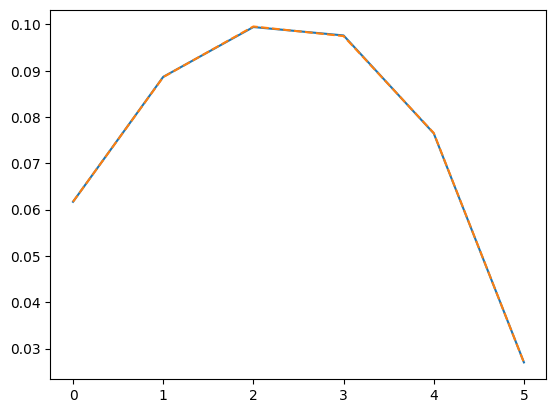

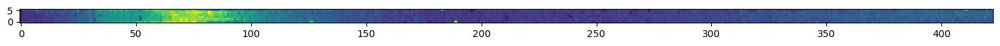

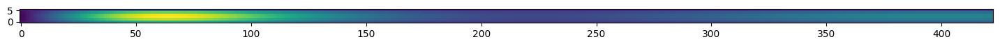

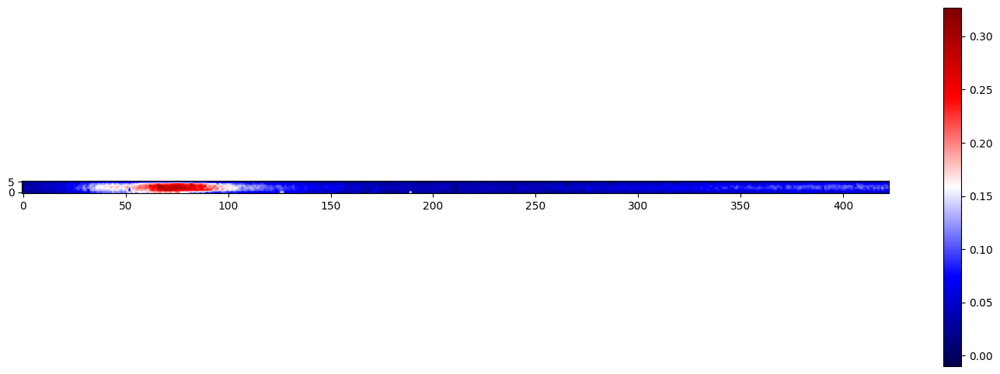

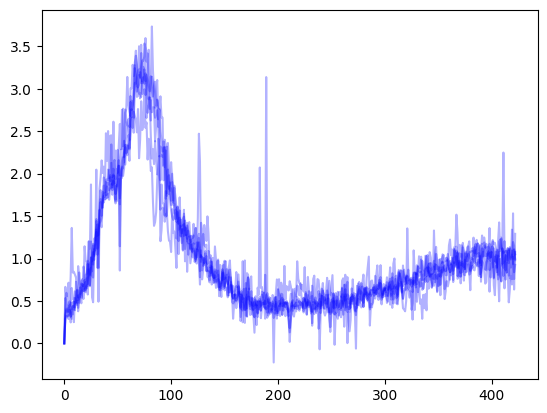

In [522]:
def Polynome(x,*coeffs):
    coeffs = np.array(coeffs)

    # repeat m times the X 2D array along 1st axis
    m = len(coeffs)
    x = x[np.newaxis, :]
    x = np.repeat(x, m, axis=0)

    # Make power series to the right shape
    power = np.arange(m)
    power = power[:, np.newaxis]

    # Take the power along the 1st axis, multiply by coeffs along the same axis, sum along the axis
    polyn = np.power(x,power)
    polyn = polyn * coeffs[:, None]
    polyn = polyn.sum(axis=0)

    return polyn


slice_indices = np.array([np.array([9,15]),np.array([15,20]),np.array([20,26])])

plt.figure(figsize=(18,6))
z = ZScaleInterval()
z1,z2 = z.get_limits(slit.data)
i = 2
bkg = rotationed[0][slice_indices[i][0]:slice_indices[i][1]]
X,Y = np.indices(bkg.shape)

x = np.arange(bkg.shape[1])
              
interp = interpolate.SmoothBivariateSpline(X.flatten(), Y.flatten(), bkg.flatten(), s=0.8)
znew = interp(X,Y,grid=False)
plt.imshow(bkg,origin="lower")

plt.figure(figsize=(18,6))
plt.imshow(znew,origin="lower")

plt.figure(figsize=(18,6))
plt.imshow(bkg-znew,origin="lower",cmap='seismic')
plt.colorbar()


plt.figure()
plt.plot(bkg.mean(axis=0),label='raw')
plt.plot(znew.mean(axis=0),label='2D spline mean')

p0 = [
    bkg.mean(), # constant shift, order 0 polynomial
    1, # order 1
    1, # order 2
    1, # order 3
    1,
    1,
    1,
]

coeff, err = cfit(Polynome,x, bkg.mean(axis=0), p0=p0)
plt.plot(Polynome(x,*coeff),label="1D polynomial")

interp = interpolate.UnivariateSpline(x,bkg.mean(axis=0),s=0.1)
plt.plot(interp(x),label='1D spline')
plt.legend()

plt.figure()
plt.plot(bkg.mean(axis=1))
plt.plot(znew.mean(axis=1),linestyle='dashed')


plt.figure(figsize=(18,6))
z = bkg / znew.mean(axis=1)[:,None]
plt.imshow(z,origin="lower")
plt.show()

plt.figure(figsize=(18,6))
spline1d = interp(Y)*znew.mean(axis=1)[:,None]
plt.imshow(spline1d,origin="lower")


plt.figure(figsize=(18,6))
plt.imshow(bkg-spline1d,origin="lower",cmap='seismic')
plt.colorbar()

plt.figure()
plt.plot(z.T,color='b',alpha=0.3)
plt.show()





# Precal

In [9]:
path = "./mastDownload/JWST/CEERS-NIRSPEC-P5-PRISM-MSATA/jw01345063001_03101_00001_nrs2_srctype.fits"
# 14
slits = dm.open(path)

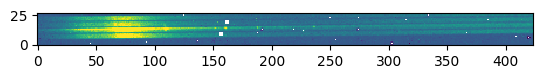

2024-06-12 15:10:30,237 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.
2024-06-12 15:10:33,176 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs2_srctype.fits>,).
2024-06-12 15:10:33,179 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_interpolated_flat: False
  user_supplied_flat: None
  inverse: False
2024-06-12 15:10:34,914 - stpipe.FlatFieldStep - INFO - No reference found for type FLAT
2024-06-12 15:10:35,085 - stpipe.FlatFieldStep - INFO - Using FFLAT reference file: ./crds_cache/references/jwst/nirspec/jwst_nirspec_fflat_0135.fits
2024-06-12 15:10:38,371 - stpipe.FlatFieldStep - INFO - Using SFLAT reference file: ./crds_cache/reference

2024-06-12 15:11:59,823 - stpipe.FlatFieldStep - INFO - Working on slit 145
2024-06-12 15:12:00,086 - stpipe.FlatFieldStep - INFO - Working on slit 152
2024-06-12 15:12:00,256 - stpipe.FlatFieldStep - INFO - Working on slit 153
2024-06-12 15:12:00,433 - stpipe.FlatFieldStep - INFO - Working on slit 156
2024-06-12 15:12:00,593 - stpipe.FlatFieldStep - INFO - Working on slit 157
2024-06-12 15:12:00,783 - stpipe.FlatFieldStep - INFO - Working on slit 158
2024-06-12 15:12:00,956 - stpipe.FlatFieldStep - INFO - Working on slit 161
2024-06-12 15:12:01,123 - stpipe.FlatFieldStep - INFO - Working on slit 164
2024-06-12 15:12:01,303 - stpipe.FlatFieldStep - INFO - Working on slit 166
2024-06-12 15:12:01,466 - stpipe.FlatFieldStep - INFO - Working on slit 167
2024-06-12 15:12:01,623 - stpipe.FlatFieldStep - INFO - Working on slit 170
2024-06-12 15:12:01,781 - stpipe.FlatFieldStep - INFO - Working on slit 5
2024-06-12 15:12:02,063 - stpipe.FlatFieldStep - INFO - Working on slit 6
2024-06-12 15:12

2024-06-12 15:12:24,733 - stpipe.FlatFieldStep - INFO - Working on slit 155
2024-06-12 15:12:24,931 - stpipe.FlatFieldStep - INFO - Working on slit 159
2024-06-12 15:12:25,126 - stpipe.FlatFieldStep - INFO - Working on slit 160
2024-06-12 15:12:25,328 - stpipe.FlatFieldStep - INFO - Working on slit 162
2024-06-12 15:12:25,515 - stpipe.FlatFieldStep - INFO - Working on slit 163
2024-06-12 15:12:25,705 - stpipe.FlatFieldStep - INFO - Working on slit 165
2024-06-12 15:12:25,900 - stpipe.FlatFieldStep - INFO - Working on slit 168
2024-06-12 15:12:26,079 - stpipe.FlatFieldStep - INFO - Working on slit 169
2024-06-12 15:12:26,290 - stpipe.FlatFieldStep - INFO - Working on slit 171
2024-06-12 15:12:35,633 - stpipe.FlatFieldStep - INFO - Results used CRDS context: jwst_1238.pmap
2024-06-12 15:12:35,634 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep done
2024-06-12 15:12:36,037 - stpipe.PathLossStep - INFO - PathLossStep instance created.
2024-06-12 15:12:37,543 - stpipe.PathLossStep - INFO

2024-06-12 15:13:03,441 - stpipe.PathLossStep - INFO - Working on slit 32
2024-06-12 15:13:03,441 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-06-12 15:13:03,442 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-06-12 15:13:03,443 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-06-12 15:13:03,461 - stpipe.PathLossStep - INFO - Working on slit 33
2024-06-12 15:13:03,462 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:03,480 - stpipe.PathLossStep - INFO - Working on slit 34
2024-06-12 15:13:03,481 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:03,498 - stpipe.PathLossStep - INFO - Working on slit 35
2024-06-12 15:13:03,498 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:

2024-06-12 15:13:04,143 - stpipe.PathLossStep - INFO - Working on slit 69
2024-06-12 15:13:04,144 - stpipe.PathLossStep - INFO - Shutter state = x, using MOS1x1 entry in ref file
2024-06-12 15:13:04,164 - stpipe.PathLossStep - INFO - Working on slit 70
2024-06-12 15:13:04,164 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,180 - stpipe.PathLossStep - INFO - Working on slit 71
2024-06-12 15:13:04,181 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,197 - stpipe.PathLossStep - INFO - Working on slit 72
2024-06-12 15:13:04,197 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,214 - stpipe.PathLossStep - INFO - Working on slit 73
2024-06-12 15:13:04,214 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,232 - stpipe.PathLossStep - INFO - Working on slit 74
2024-06-12 15:13:04,232

2024-06-12 15:13:04,873 - stpipe.PathLossStep - INFO - Working on slit 109
2024-06-12 15:13:04,874 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,894 - stpipe.PathLossStep - INFO - Working on slit 110
2024-06-12 15:13:04,895 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,911 - stpipe.PathLossStep - INFO - Working on slit 111
2024-06-12 15:13:04,912 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,928 - stpipe.PathLossStep - INFO - Working on slit 112
2024-06-12 15:13:04,929 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:04,945 - stpipe.PathLossStep - INFO - Working on slit 113
2024-06-12 15:13:04,946 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-06-12 15:13:04,946 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, us

2024-06-12 15:13:05,573 - stpipe.PathLossStep - INFO - Working on slit 147
2024-06-12 15:13:05,573 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:05,590 - stpipe.PathLossStep - INFO - Working on slit 148
2024-06-12 15:13:05,591 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-06-12 15:13:05,592 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-06-12 15:13:05,592 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-06-12 15:13:05,609 - stpipe.PathLossStep - INFO - Working on slit 149
2024-06-12 15:13:05,609 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-06-12 15:13:05,625 - stpipe.PathLossStep - INFO - Working on slit 150
2024-06-12 15:13:05,626 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-06-12 

2024-06-12 15:13:35,450 - stpipe.BarShadowStep - INFO - Working on slitlet 54
2024-06-12 15:13:35,500 - stpipe.BarShadowStep - INFO - Working on slitlet 56
2024-06-12 15:13:35,569 - stpipe.BarShadowStep - INFO - Working on slitlet 57
2024-06-12 15:13:35,641 - stpipe.BarShadowStep - INFO - Working on slitlet 58
2024-06-12 15:13:35,703 - stpipe.BarShadowStep - INFO - Working on slitlet 60
2024-06-12 15:13:35,770 - stpipe.BarShadowStep - INFO - Working on slitlet 61
2024-06-12 15:13:35,837 - stpipe.BarShadowStep - INFO - Working on slitlet 64
2024-06-12 15:13:35,893 - stpipe.BarShadowStep - INFO - Working on slitlet 65
2024-06-12 15:13:35,970 - stpipe.BarShadowStep - INFO - Working on slitlet 66
2024-06-12 15:13:36,035 - stpipe.BarShadowStep - INFO - Working on slitlet 67
2024-06-12 15:13:36,101 - stpipe.BarShadowStep - INFO - Working on slitlet 72
2024-06-12 15:13:36,166 - stpipe.BarShadowStep - INFO - Working on slitlet 74
2024-06-12 15:13:36,230 - stpipe.BarShadowStep - INFO - Working 

2024-06-12 15:13:41,518 - stpipe.BarShadowStep - INFO - Working on slitlet 98
2024-06-12 15:13:41,580 - stpipe.BarShadowStep - INFO - Working on slitlet 99
2024-06-12 15:13:41,647 - stpipe.BarShadowStep - INFO - Working on slitlet 105
2024-06-12 15:13:41,728 - stpipe.BarShadowStep - INFO - Working on slitlet 106
2024-06-12 15:13:41,795 - stpipe.BarShadowStep - INFO - Working on slitlet 107
2024-06-12 15:13:41,860 - stpipe.BarShadowStep - INFO - Working on slitlet 109
2024-06-12 15:13:41,920 - stpipe.BarShadowStep - INFO - Working on slitlet 112
2024-06-12 15:13:42,005 - stpipe.BarShadowStep - INFO - Working on slitlet 117
2024-06-12 15:13:42,086 - stpipe.BarShadowStep - INFO - Working on slitlet 118
2024-06-12 15:13:42,151 - stpipe.BarShadowStep - INFO - Working on slitlet 120
2024-06-12 15:13:42,195 - stpipe.BarShadowStep - INFO - Working on slitlet 121
2024-06-12 15:13:42,258 - stpipe.BarShadowStep - INFO - Working on slitlet 123
2024-06-12 15:13:42,308 - stpipe.BarShadowStep - INFO 

2024-06-12 15:14:13,136 - stpipe.PhotomStep - INFO - Working on slit 39
2024-06-12 15:14:13,136 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.95022e+12
2024-06-12 15:14:13,141 - stpipe.PhotomStep - INFO - Working on slit 42
2024-06-12 15:14:13,142 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.98139e+12
2024-06-12 15:14:13,147 - stpipe.PhotomStep - INFO - Working on slit 46
2024-06-12 15:14:13,148 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.94362e+12
2024-06-12 15:14:13,153 - stpipe.PhotomStep - INFO - Working on slit 50
2024-06-12 15:14:13,154 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.97048e+12
2024-06-12 15:14:13,158 - stpipe.PhotomStep - INFO - Working on slit 54
2024-06-12 15:14:13,159 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.94529e+12
2024-06-12 15:14:13,164 - stpipe.PhotomStep - INFO - Working on slit 56
2024-06-12 15:14:13,165 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.97976e+12
2024-06-12 15:14:13,171 - stpipe.PhotomStep - INFO - Working on slit 57
2024-06-12

2024-06-12 15:14:13,465 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.96823e+12
2024-06-12 15:14:13,470 - stpipe.PhotomStep - INFO - Working on slit 156
2024-06-12 15:14:13,471 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.9407e+12
2024-06-12 15:14:13,475 - stpipe.PhotomStep - INFO - Working on slit 157
2024-06-12 15:14:13,476 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.98877e+12
2024-06-12 15:14:13,481 - stpipe.PhotomStep - INFO - Working on slit 158
2024-06-12 15:14:13,481 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.9983e+12
2024-06-12 15:14:13,487 - stpipe.PhotomStep - INFO - Working on slit 161
2024-06-12 15:14:13,488 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.95658e+12
2024-06-12 15:14:13,492 - stpipe.PhotomStep - INFO - Working on slit 164
2024-06-12 15:14:13,493 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.99528e+12
2024-06-12 15:14:13,498 - stpipe.PhotomStep - INFO - Working on slit 166
2024-06-12 15:14:13,499 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.99969e+

2024-06-12 15:14:13,790 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.0751e+12
2024-06-12 15:14:13,796 - stpipe.PhotomStep - INFO - Working on slit 96
2024-06-12 15:14:13,797 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.07909e+12
2024-06-12 15:14:13,803 - stpipe.PhotomStep - INFO - Working on slit 98
2024-06-12 15:14:13,804 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.1008e+12
2024-06-12 15:14:13,808 - stpipe.PhotomStep - INFO - Working on slit 99
2024-06-12 15:14:13,809 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.10353e+12
2024-06-12 15:14:13,815 - stpipe.PhotomStep - INFO - Working on slit 105
2024-06-12 15:14:13,815 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.05646e+12
2024-06-12 15:14:13,820 - stpipe.PhotomStep - INFO - Working on slit 106
2024-06-12 15:14:13,821 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.07806e+12
2024-06-12 15:14:13,826 - stpipe.PhotomStep - INFO - Working on slit 107
2024-06-12 15:14:13,827 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.07024e+12


2024-06-12 15:14:49,584 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:14:49,675 - stpipe.ResampleSpecStep - INFO - Drizzling (29, 423) --> (21, 423)
2024-06-12 15:14:49,682 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:14:49,773 - stpipe.ResampleSpecStep - INFO - Drizzling (29, 423) --> (21, 423)
2024-06-12 15:14:49,778 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:14:49,868 - stpipe.ResampleSpecStep - INFO - Drizzling (29, 423) --> (21, 423)
2024-06-12 15:14:49,872 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:14:49,965 - stpipe.ResampleSpecStep - INFO - Drizzling (29, 423) --> (21, 423)
2024-06-12 15:14:49,986 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.048251100 53.014828250 215.049175863 53.014828250 215.049175863 53.014839132 215.048251100 53.014839132
2024-06-12 15:14:50,276 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:

2024-06-12 15:14:54,876 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.058843771 53.014204781 215.059772523 53.014204781 215.059772523 53.014215677 215.058843771 53.014215677
2024-06-12 15:14:55,169 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:14:55,170 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:14:55,170 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:14:55,171 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:14:55,290 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:14:55,377 - stpipe.ResampleSpecStep - INFO - Drizzling (29, 427) --> (21, 427)
2024-06-12 15:14:55,380 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:14:55,475 - stpipe.ResampleSpecStep - INFO - Drizzling (29, 427) --> (21, 427)
2024-06-12 15:14:55,478 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 1

2024-06-12 15:15:01,528 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:15:01,660 - stpipe.ResampleSpecStep - INFO - Drizzling (18, 421) --> (11, 421)
2024-06-12 15:15:01,664 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:15:01,776 - stpipe.ResampleSpecStep - INFO - Drizzling (18, 421) --> (11, 421)
2024-06-12 15:15:01,779 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:01,880 - stpipe.ResampleSpecStep - INFO - Drizzling (18, 421) --> (11, 421)
2024-06-12 15:15:01,897 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.044823470 53.013518202 215.045261629 53.013518202 215.045261629 53.013523262 215.044823470 53.013523262
2024-06-12 15:15:02,234 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:15:02,235 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:15:02,236 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:

2024-06-12 15:15:08,302 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:15:08,303 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:15:08,303 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:15:08,304 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:15:08,447 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:15:08,556 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 426) --> (16, 426)
2024-06-12 15:15:08,559 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:15:08,675 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 426) --> (16, 426)
2024-06-12 15:15:08,679 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:15:08,791 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 426) --> (16, 426)
2024-06-12 15:15:08,795 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:08,911 - stpipe.Resampl

2024-06-12 15:15:14,487 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:15:14,595 - stpipe.ResampleSpecStep - INFO - Drizzling (17, 425) --> (11, 425)
2024-06-12 15:15:14,598 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:14,702 - stpipe.ResampleSpecStep - INFO - Drizzling (17, 425) --> (11, 425)
2024-06-12 15:15:14,720 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.069749579 53.010585831 215.070192126 53.010585831 215.070192126 53.010590778 215.069749579 53.010590778
2024-06-12 15:15:15,070 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:15:15,071 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:15:15,071 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:15:15,072 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:15:15,199 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:

2024-06-12 15:15:21,419 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:15:21,420 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:15:21,574 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:15:21,712 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 427) --> (21, 427)
2024-06-12 15:15:21,715 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:15:21,882 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 427) --> (21, 427)
2024-06-12 15:15:21,889 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:15:22,046 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 427) --> (21, 427)
2024-06-12 15:15:22,050 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:22,214 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 427) --> (21, 427)
2024-06-12 15:15:22,251 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.068775765 53.009077119 215.

2024-06-12 15:15:35,096 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:35,260 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 423) --> (21, 423)
2024-06-12 15:15:35,287 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.041731221 53.005128890 215.042652508 53.005128890 215.042652508 53.005138395 215.041731221 53.005138395
2024-06-12 15:15:35,646 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:15:35,647 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:15:35,648 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:15:35,648 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:15:35,800 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:15:35,925 - stpipe.ResampleSpecStep - INFO - Drizzling (18, 426) --> (11, 426)
2024-06-12 15:15:35,927 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:1

2024-06-12 15:15:41,766 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:15:41,860 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 376) --> (21, 376)
2024-06-12 15:15:41,863 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:15:41,986 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 376) --> (21, 376)
2024-06-12 15:15:41,990 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:15:42,122 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 376) --> (21, 376)
2024-06-12 15:15:42,126 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:42,229 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 376) --> (21, 376)
2024-06-12 15:15:42,252 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.072600428 52.999610379 215.073533289 52.999610379 215.073533289 52.999619177 215.072600428 52.999619177
2024-06-12 15:15:42,581 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:

2024-06-12 15:15:48,377 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:15:48,481 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 317) --> (21, 317)
2024-06-12 15:15:48,485 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:48,604 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 317) --> (21, 317)
2024-06-12 15:15:48,623 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.066939945 52.997314471 215.067870549 52.997314471 215.067870549 52.997322940 215.066939945 52.997322940
2024-06-12 15:15:48,918 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:15:48,919 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:15:48,919 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:15:48,920 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:15:49,051 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:

2024-06-12 15:15:55,615 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:15:55,615 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:15:55,780 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:15:55,893 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 306) --> (21, 306)
2024-06-12 15:15:55,895 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:15:56,011 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 306) --> (21, 306)
2024-06-12 15:15:56,015 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:15:56,143 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 306) --> (21, 306)
2024-06-12 15:15:56,147 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:15:56,259 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 306) --> (21, 306)
2024-06-12 15:15:56,279 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.052665257 52.995618387 215.

2024-06-12 15:16:02,935 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:16:03,155 - stpipe.ResampleSpecStep - INFO - Drizzling (15, 197) --> (11, 197)
2024-06-12 15:16:03,196 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.074405035 52.994539152 215.074848109 52.994539152 215.074848109 52.994542963 215.074405035 52.994542963
2024-06-12 15:16:03,626 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:16:03,627 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:16:03,627 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:16:03,628 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:16:03,780 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:16:03,892 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 289) --> (21, 289)
2024-06-12 15:16:03,894 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:1

2024-06-12 15:16:09,376 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:16:09,469 - stpipe.ResampleSpecStep - INFO - Drizzling (24, 134) --> (21, 134)
2024-06-12 15:16:09,471 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:16:09,561 - stpipe.ResampleSpecStep - INFO - Drizzling (24, 134) --> (21, 134)
2024-06-12 15:16:09,564 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:16:09,668 - stpipe.ResampleSpecStep - INFO - Drizzling (24, 134) --> (21, 134)
2024-06-12 15:16:09,670 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:16:09,769 - stpipe.ResampleSpecStep - INFO - Drizzling (24, 134) --> (21, 134)
2024-06-12 15:16:09,770 - stpipe.ResampleSpecStep - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/jwst/resample/resample.py:475: RuntimeWarning: divide by zero encountered in reciprocal
2024-06-12 15:16:09,771 - stpipe.ResampleSpecStep - WARNING -   output_variance = np.re

2024-06-12 15:16:15,040 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:16:15,148 - stpipe.ResampleSpecStep - INFO - Drizzling (14, 159) --> (11, 159)
2024-06-12 15:16:15,150 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:16:15,253 - stpipe.ResampleSpecStep - INFO - Drizzling (14, 159) --> (11, 159)
2024-06-12 15:16:15,268 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.042930368 52.990470179 215.043367518 52.990470179 215.043367518 52.990473736 215.042930368 52.990473736
2024-06-12 15:16:15,552 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:16:15,553 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:16:15,553 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:16:15,553 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:16:15,678 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:

2024-06-12 15:16:28,281 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:16:28,281 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:16:28,423 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:16:28,546 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 418) --> (21, 418)
2024-06-12 15:16:28,549 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:16:28,674 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 418) --> (21, 418)
2024-06-12 15:16:28,679 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:16:28,797 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 418) --> (21, 418)
2024-06-12 15:16:28,802 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:16:28,934 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 418) --> (21, 418)
2024-06-12 15:16:28,957 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.011174703 53.014125863 215.

2024-06-12 15:16:35,584 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:16:35,721 - stpipe.ResampleSpecStep - INFO - Drizzling (18, 418) --> (11, 418)
2024-06-12 15:16:35,742 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.024310082 53.013231463 215.024744271 53.013231463 215.024744271 53.013236344 215.024310082 53.013236344
2024-06-12 15:16:36,108 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:16:36,109 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:16:36,111 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:16:36,113 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:16:36,253 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:16:36,375 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 418) --> (21, 418)
2024-06-12 15:16:36,378 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:1

2024-06-12 15:16:43,068 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:16:43,227 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 416) --> (16, 416)
2024-06-12 15:16:43,229 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:16:43,399 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 416) --> (16, 416)
2024-06-12 15:16:43,402 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:16:43,588 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 416) --> (16, 416)
2024-06-12 15:16:43,599 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:16:43,782 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 416) --> (16, 416)
2024-06-12 15:16:43,819 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  214.994758672 53.011421280 214.995424703 53.011421280 214.995424703 53.011428385 214.994758672 53.011428385
2024-06-12 15:16:44,202 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:

2024-06-12 15:16:50,137 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.016068810 53.010610760 215.016501362 53.010610760 215.016501362 53.010615442 215.016068810 53.010615442
2024-06-12 15:16:50,447 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:16:50,447 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:16:50,448 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:16:50,448 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:16:50,578 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:16:50,670 - stpipe.ResampleSpecStep - INFO - Drizzling (18, 418) --> (11, 418)
2024-06-12 15:16:50,672 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:16:50,776 - stpipe.ResampleSpecStep - INFO - Drizzling (18, 418) --> (11, 418)
2024-06-12 15:16:50,778 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 1

2024-06-12 15:16:56,602 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:16:56,735 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 419) --> (21, 419)
2024-06-12 15:16:56,740 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:16:56,863 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 419) --> (21, 419)
2024-06-12 15:16:56,868 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:16:56,991 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 419) --> (21, 419)
2024-06-12 15:16:57,019 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.014141831 53.009549455 215.015052620 53.009549455 215.015052620 53.009559177 215.014141831 53.009559177
2024-06-12 15:16:57,354 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:16:57,354 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:16:57,355 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:

2024-06-12 15:17:02,837 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:17:02,837 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:17:02,838 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:17:02,838 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:17:02,983 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:17:03,204 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 418) --> (16, 418)
2024-06-12 15:17:03,208 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:17:03,413 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 418) --> (16, 418)
2024-06-12 15:17:03,419 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:17:03,622 - stpipe.ResampleSpecStep - INFO - Drizzling (23, 418) --> (16, 418)
2024-06-12 15:17:03,626 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:17:03,758 - stpipe.Resampl

2024-06-12 15:17:11,546 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:17:11,653 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 418) --> (21, 418)
2024-06-12 15:17:11,657 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:17:11,763 - stpipe.ResampleSpecStep - INFO - Drizzling (28, 418) --> (21, 418)
2024-06-12 15:17:11,783 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  214.992930677 53.004657820 214.993832749 53.004657820 214.993832749 53.004666765 214.992930677 53.004666765
2024-06-12 15:17:12,081 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:17:12,082 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:17:12,082 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:17:12,083 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:17:12,208 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:

2024-06-12 15:17:22,813 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:17:22,814 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:17:22,954 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:17:23,059 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 419) --> (21, 419)
2024-06-12 15:17:23,063 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:17:23,175 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 419) --> (21, 419)
2024-06-12 15:17:23,179 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:17:23,287 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 419) --> (21, 419)
2024-06-12 15:17:23,291 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:17:23,402 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 419) --> (21, 419)
2024-06-12 15:17:23,407 - stpipe.ResampleSpecStep - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-pack

2024-06-12 15:17:32,233 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:17:32,512 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 419) --> (21, 419)
2024-06-12 15:17:32,521 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:17:32,750 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 419) --> (21, 419)
2024-06-12 15:17:32,755 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:17:32,907 - stpipe.ResampleSpecStep - INFO - Drizzling (27, 419) --> (21, 419)
2024-06-12 15:17:32,938 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  214.989475376 52.995450889 214.990375373 52.995450889 214.990375373 52.995458875 214.989475376 52.995458875
2024-06-12 15:17:33,372 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:17:33,373 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:17:33,374 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:

2024-06-12 15:17:42,804 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:17:42,806 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:17:42,807 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:17:42,808 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:17:43,251 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:17:43,462 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 362) --> (21, 362)
2024-06-12 15:17:43,466 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:17:43,690 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 362) --> (21, 362)
2024-06-12 15:17:43,696 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:17:43,946 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 362) --> (21, 362)
2024-06-12 15:17:43,954 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:17:44,340 - stpipe.Resampl

2024-06-12 15:17:54,680 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:17:54,854 - stpipe.ResampleSpecStep - INFO - Drizzling (20, 306) --> (16, 306)
2024-06-12 15:17:54,857 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:17:55,012 - stpipe.ResampleSpecStep - INFO - Drizzling (20, 306) --> (16, 306)
2024-06-12 15:17:55,045 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.023863628 52.993084093 215.024536898 52.993084093 215.024536898 52.993089824 215.023863628 52.993089824
2024-06-12 15:17:55,833 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:17:55,834 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:17:55,835 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:17:55,836 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:17:56,073 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:

2024-06-12 15:18:07,380 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:18:07,381 - stpipe.ResampleSpecStep - INFO - Driz parameter weight_type: ivm
2024-06-12 15:18:07,537 - stpipe.ResampleSpecStep - INFO - Resampling science data
2024-06-12 15:18:07,670 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 305) --> (21, 305)
2024-06-12 15:18:07,672 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:18:07,797 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 305) --> (21, 305)
2024-06-12 15:18:07,801 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:18:07,955 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 305) --> (21, 305)
2024-06-12 15:18:07,959 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:18:08,091 - stpipe.ResampleSpecStep - INFO - Drizzling (25, 305) --> (21, 305)
2024-06-12 15:18:08,113 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  215.007875380 52.991762590 215.

2024-06-12 15:18:13,969 - stpipe.ResampleSpecStep - INFO - Resampling var_rnoise
2024-06-12 15:18:14,089 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 272) --> (21, 272)
2024-06-12 15:18:14,092 - stpipe.ResampleSpecStep - INFO - Resampling var_poisson
2024-06-12 15:18:14,223 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 272) --> (21, 272)
2024-06-12 15:18:14,226 - stpipe.ResampleSpecStep - INFO - Resampling var_flat
2024-06-12 15:18:14,333 - stpipe.ResampleSpecStep - INFO - Drizzling (26, 272) --> (21, 272)
2024-06-12 15:18:14,355 - stpipe.ResampleSpecStep - INFO - Update S_REGION to POLYGON ICRS  214.995115290 52.989880516 214.996017266 52.989880516 214.996017266 52.989887934 214.995115290 52.989887934
2024-06-12 15:18:14,680 - stpipe.ResampleSpecStep - INFO - Driz parameter kernal: square
2024-06-12 15:18:14,681 - stpipe.ResampleSpecStep - INFO - Driz parameter pixfrac: 1.0
2024-06-12 15:18:14,681 - stpipe.ResampleSpecStep - INFO - Driz parameter fillval: INDEF
2024-06-12 15:

2024-06-12 15:18:21,775 - stpipe.ResampleSpecStep - INFO - Results used CRDS context: jwst_1238.pmap
2024-06-12 15:18:21,776 - stpipe.ResampleSpecStep - INFO - Step ResampleSpecStep done


In [11]:
from jwst.flatfield import FlatFieldStep
from jwst.pathloss import PathLossStep
from jwst.barshadow import BarShadowStep
from jwst.photom import PhotomStep
from jwst.resample import ResampleSpecStep

slit = slits.slits[14]
data = slit.data
plt.figure()
z = ZScaleInterval()
z1,z2 = z.get_limits(data)
plt.imshow(data,origin="lower",vmin=z1,vmax=z2,interpolation="none")
plt.show()

flatted = FlatFieldStep.call(slits)
pathed = PathLossStep.call(flatted,source_type="EXTENDED")
shadowed = BarShadowStep.call(pathed,source_type="EXTENDED")
photomed = PhotomStep.call(shadowed,source_type="EXTENDED")
resamped = ResampleSpecStep.call(photomed)

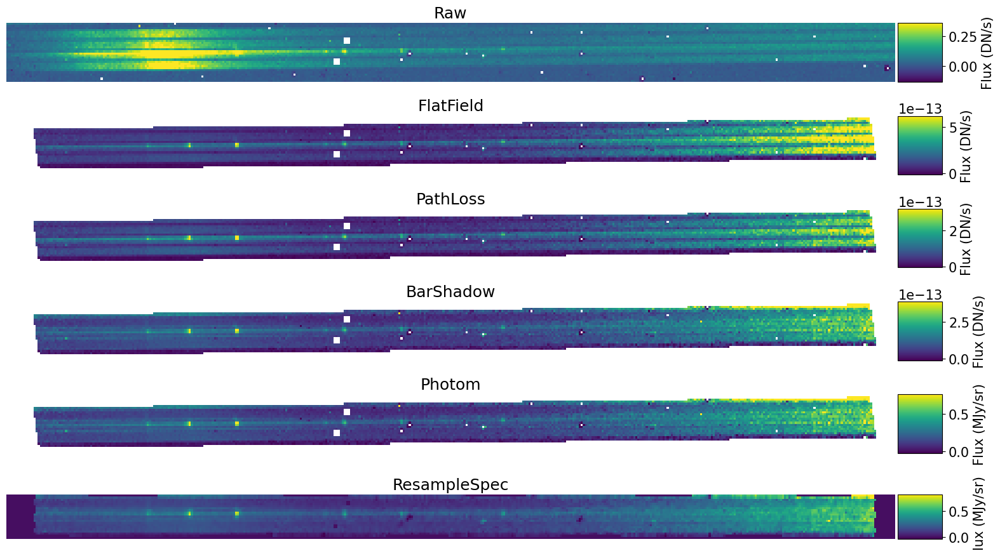

In [45]:
plt.rcParams["font.size"] = "15"

data = [slits.slits[14].data,flatted.slits[14].data,pathed.slits[14].data,shadowed.slits[14].data,photomed.slits[14].data,resamped.slits[14].data]
title = ["Raw","FlatField","PathLoss","BarShadow","Photom","ResampleSpec"]
units = [slits.slits[14].meta.bunit_data,flatted.slits[14].meta.bunit_data,pathed.slits[14].meta.bunit_data,shadowed.slits[14].meta.bunit_data,photomed.slits[14].meta.bunit_data,resamped.slits[14].meta.bunit_data]

n=6
fig, axs = plt.subplots(n, 1, figsize=(16, n*1.5))

for i, (ax, array) in enumerate(zip(axs, data)):
    z = ZScaleInterval()
    z1,z2 = z.get_limits(array)

    # Plot each array
    im = ax.imshow(array, origin='lower',interpolation='none',vmin=z1,vmax=z2)
    # Add a colorbar with a height of the individual image
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', label=f"Flux ({units[i]})")
    ax.axis('off')
    ax.set_title(title[i])

plt.tight_layout()
plt.show()

# Spectral mean + scatter plot of precal

In [63]:
def getPeaksPrecise(x,y,peaks):
    try :
        coeff, err, info, msg, ier = cfit(slitletModel, x, y, p0=[*peaks,*y[peaks],0.5,0],full_output=True)
        
        x = np.linspace(0,x[-1], 100)
        num_sims = 1000
        sim_params = np.random.multivariate_normal(coeff, err, size=num_sims)
        sim_vals = [slitletModel(x, *params) for params in sim_params]
        min_vals = np.min(sim_vals, axis=0)
        max_vals = np.max(sim_vals, axis=0)
        plt.plot(x,slitletModel(x,*coeff),color='r',linestyle="dashed",label='Fit')
        plt.fill_between(x, max_vals, min_vals, alpha=0.1, color = 'gray')
    except :
        print("error")
        return peaks
    return np.array(coeff[:3])

def gaussian(x,x0,A,s):
    return A * np.exp(-(x-x0)**2 / (2*s**2))

def slitletModel(x,x1,x2,x3,A1,A2,A3,s,c):
    return gaussian(x,x1,A1,s) + gaussian(x,x2,A2,s) + gaussian(x,x3,A3,s) + c

def getPeakSlice(peaks,n):
    # Slice radius
    xmin = np.array([
        round(peaks[0]-n),
        round(peaks[1]-n),
        round(peaks[2]-n)])

    xmax = np.array([
        round(peaks[0]+n+1),
        round(peaks[1]+n+1),
        round(peaks[2]+n+1)])

    return np.array([xmin,xmax]).T


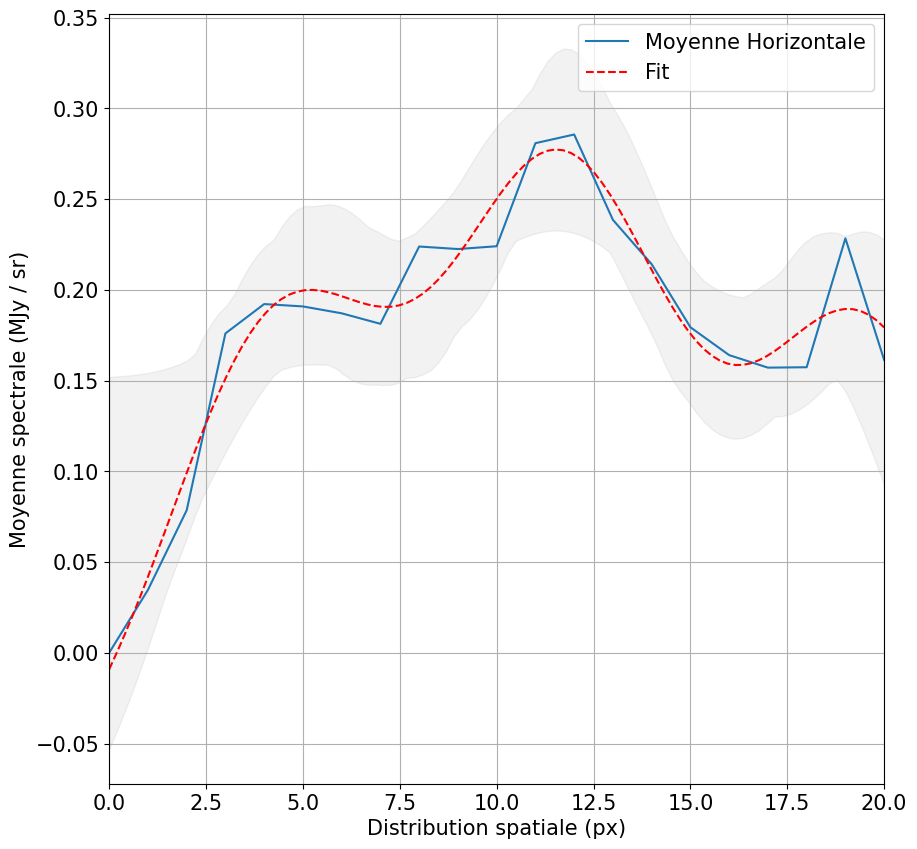

[3, 6, 18, 21]


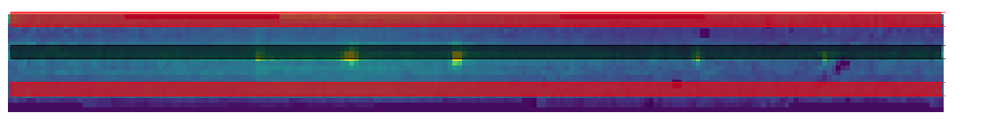

In [90]:
slit = resamped.slits[14]

radius = 1

data = sigma_clip(slit.data, sigma=5, masked=True)

# Get vertical cross section by summing horizontally
horiz_sum = data.mean(axis=1)

#########################
plt.figure(figsize=(10,10))
plt.plot(horiz_sum,label="Moyenne Horizontale")
plt.grid(True)
#########################


# Determine 3 maxima for 3 slits
peaks = []
j = 2

while not len(peaks) == 3:
    if j > 6:
        break
    peaks = find_peaks_cwt(horiz_sum,j)
    j += 1

if not len(peaks) == 3 or np.any(peaks > len(horiz_sum)) or np.any(peaks < 0):
    start_index = np.where(horiz_sum > 0)[0][0]
    end_index = np.where(horiz_sum > 0)[0][-1]
    n = end_index - start_index
    xmin = np.array([round(n / 6)-radius, round(n/2)-radius, round(5*n/6)-radius]) + start_index
    xmax = np.array([round(n / 6)+radius, round(n/2)+radius, round(5*n/6)+radius]) + start_index + 1
    slice_indices = np.array([xmin, xmax]).T
    
# Subpixel peaks
peaks = np.sort(getPeaksPrecise(range(len(horiz_sum)),horiz_sum,peaks))


slice_indices = getPeakSlice(peaks,radius)

    
#####################
plt.legend()
plt.gcf().gca().margins(x=0)
plt.xlabel("Distribution spatiale (px)")
plt.ylabel("Moyenne spectrale (MJy / sr)")
plt.show()
#####################
data = slit.data[:,14:-210]
plt.figure(figsize=(16,8))
z = ZScaleInterval()
z1,z2 = z.get_limits(data)

x = np.arange(0,data.shape[1],1)
# Plot each array
plt.imshow(data, origin='lower',interpolation='none',vmin=z1,vmax=z2)
plt.axis('off')
_ = slice_indices
_ = [_[0][0],_[0][1],_[2][0],_[2][1]]
print(_)
plt.hlines(_,0,data.shape[1],color='r',linewidth=0.5)
_ = slice_indices
plt.hlines([_[1][0],_[1][1]],0,data.shape[1],color='k',linewidth=0.5)
for i in range(3):
    if i == 1:
        plt.fill_between(x,slice_indices[i][0],slice_indices[i][1],color='k',alpha=0.6)
        continue
    plt.fill_between(x,slice_indices[i][0],slice_indices[i][1],color='r',alpha=0.6)
plt.show()

#####################

# Fit + background + signal

2024-05-26 16:10:23,195 - stpipe - WARNING - /tmp/ipykernel_86/2135745652.py:24: RuntimeWarning: divide by zero encountered in divide
2024-05-26 16:10:23,195 - stpipe - WARNING -   w = 1/dy
2024-05-26 16:10:23,196 - stpipe - WARNING - 


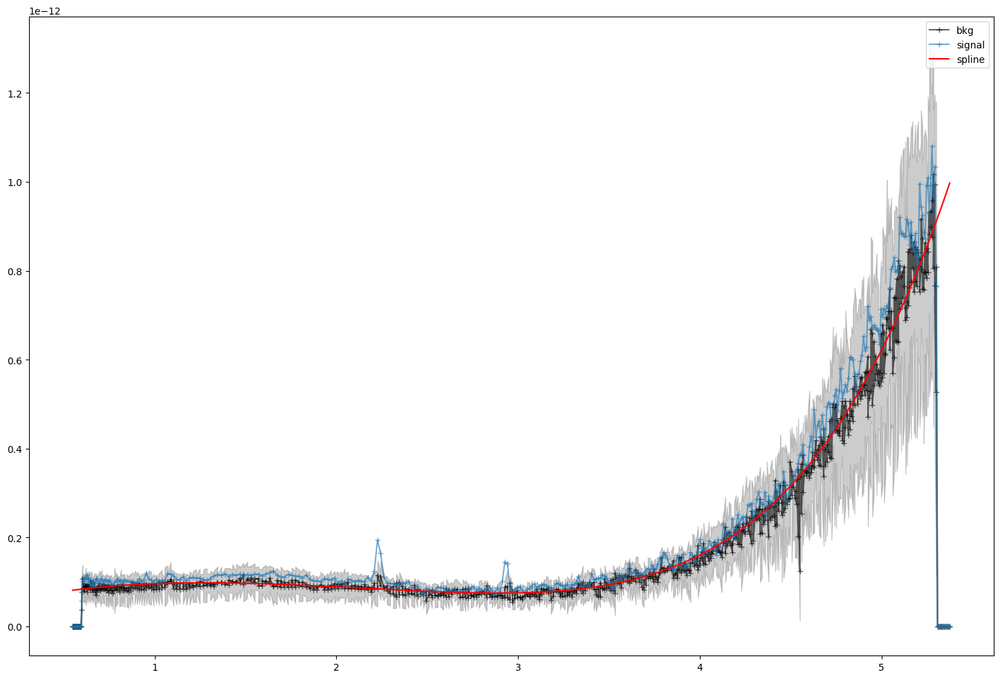

In [52]:
%matplotlib inline

slices = BBSS.SelectSlice(resamped[0])
Y,X = np.indices(resamped[0].data.shape)
ra,dec,lamb = resamped[0].meta.wcs.transform("detector","world",X,Y)

x = np.append(lamb[peaks[0][0]:peaks[0][1]].mean(axis=0),
              lamb[peaks[2][0]:peaks[2][1]].mean(axis=0))


y = np.append(resamped[0].data[peaks[0][0]:peaks[0][1]].mean(axis=0),
              resamped[0].data[peaks[2][0]:peaks[2][1]].mean(axis=0))
dy = np.append(resamped[0].data[peaks[0][0]:peaks[0][1]].std(axis=0),
              resamped[0].data[peaks[2][0]:peaks[2][1]].std(axis=0))

indices = np.argsort(x)
x = x[indices]
y = y[indices]
dy = dy[indices]
y = sigma_clip(y, sigma=5)
x = x[~y.mask]
dy = dy[~y.mask]
y = np.array(y[~y.mask])
w = 1/dy
w[~np.isfinite(w)] = 0
w /= w.mean()

plt.figure(figsize=(18,12))
plt.fill_between(x,y+dy,y-dy,alpha=0.4,color="gray")
plt.plot(x,y,marker="+",alpha=0.6,label="bkg",color="k")
plt.plot(lamb[peaks[1][0]:peaks[1][1]].mean(axis=0),resamped[0].data[peaks[1][0]:peaks[1][1]].mean(axis=0),marker="+",alpha=0.6,label="signal")
    
interp = interpolate.UnivariateSpline(x,y,w=w,s=0.01,k=5)
fitted = interp(np.linspace(x.min(),x.max(),300))
plt.plot(np.linspace(x.min(),x.max(),300),fitted,color='red',label='spline')
    
plt.legend()
plt.show()



# Fit of background and image

4


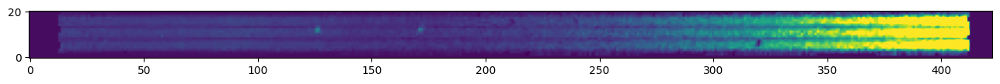

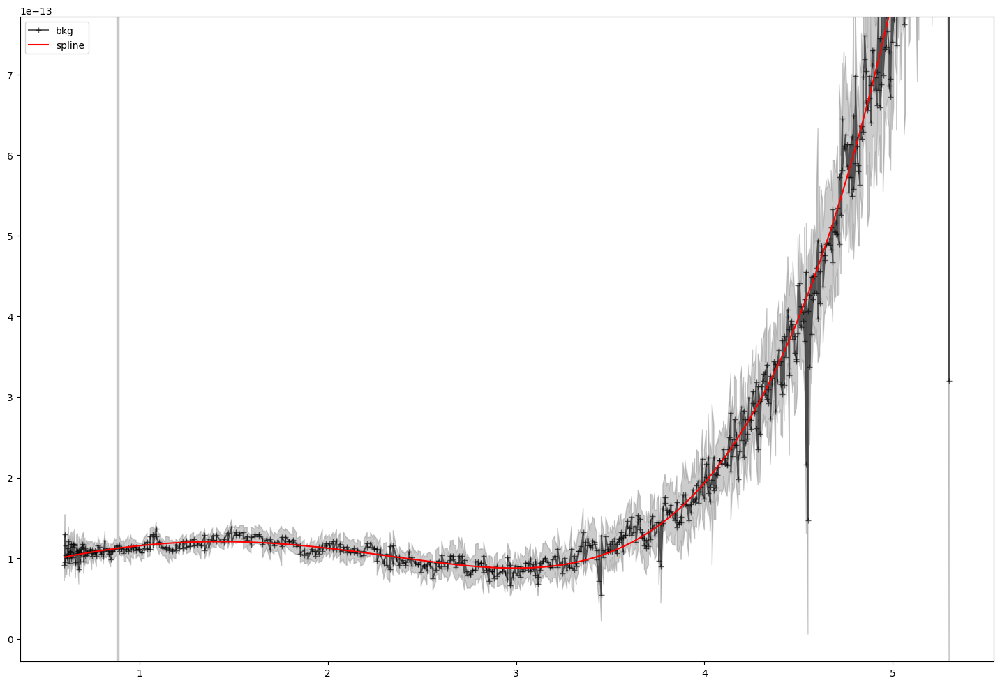

4


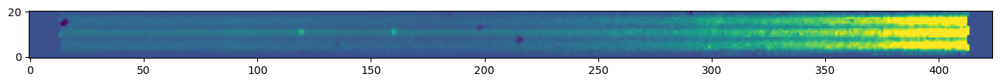

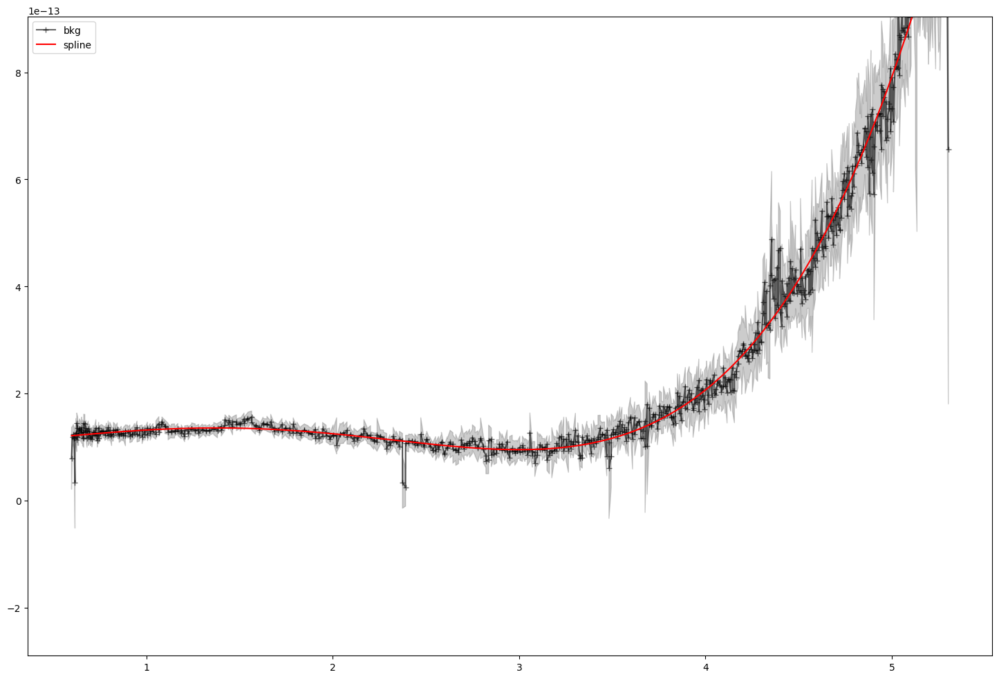

4


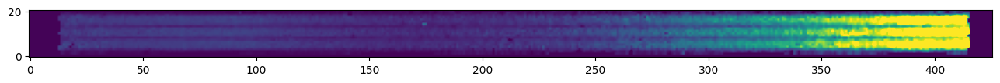

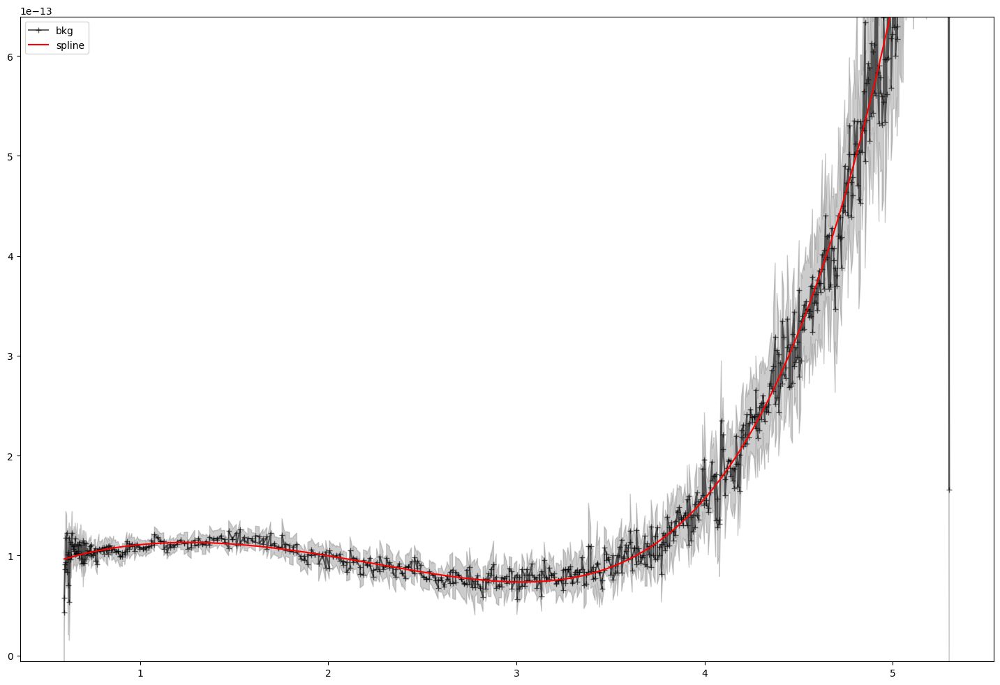

2024-05-26 23:02:21,924 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


2024-05-26 23:02:23,133 - stpipe - WARNING - /tmp/ipykernel_86/60350248.py:45: UserWarning: 
2024-05-26 23:02:23,134 - stpipe - WARNING - The maximal number of iterations maxit (set to 20 by the program)
2024-05-26 23:02:23,134 - stpipe - WARNING - allowed for finding a smoothing spline with fp=s has been reached: s
2024-05-26 23:02:23,135 - stpipe - WARNING - too small.
2024-05-26 23:02:23,136 - stpipe - WARNING - There is an approximation returned but the corresponding weighted sum
2024-05-26 23:02:23,136 - stpipe - WARNING - of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
2024-05-26 23:02:23,137 - stpipe - WARNING -   interp = interpolate.UnivariateSpline(x,y,w=w,s=0.01,k=5,check_finite=True)
2024-05-26 23:02:23,138 - stpipe - WARNING - 


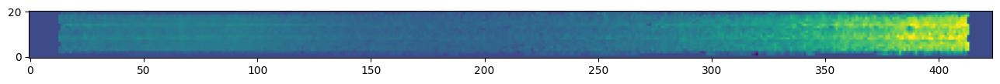

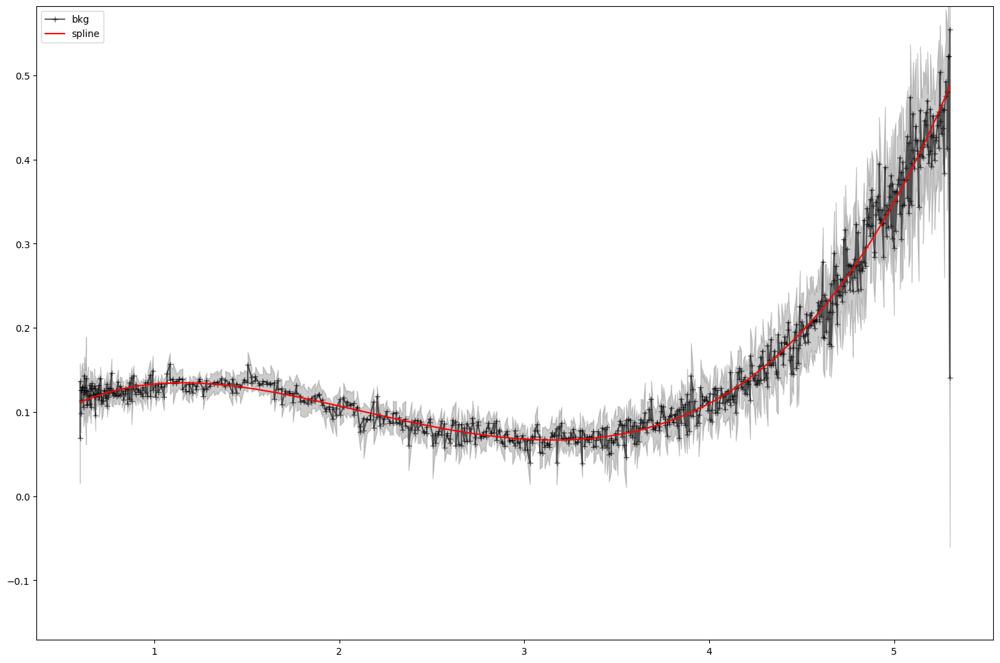

4


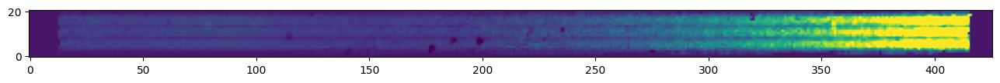

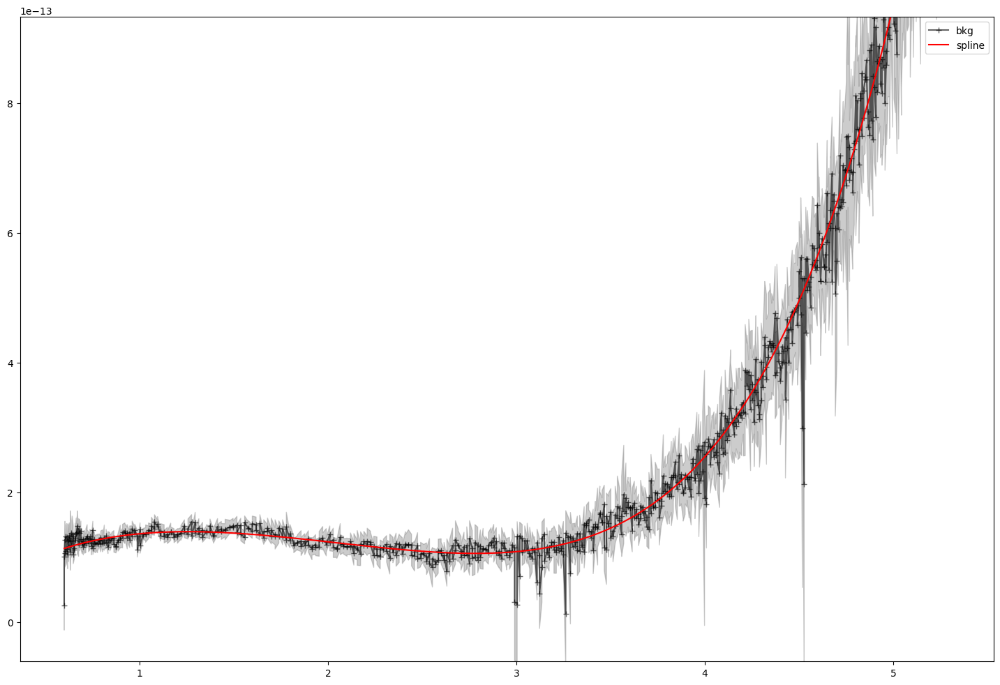

4


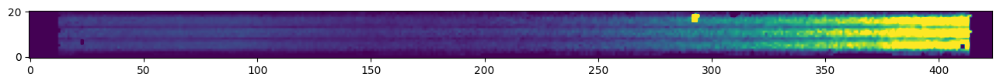

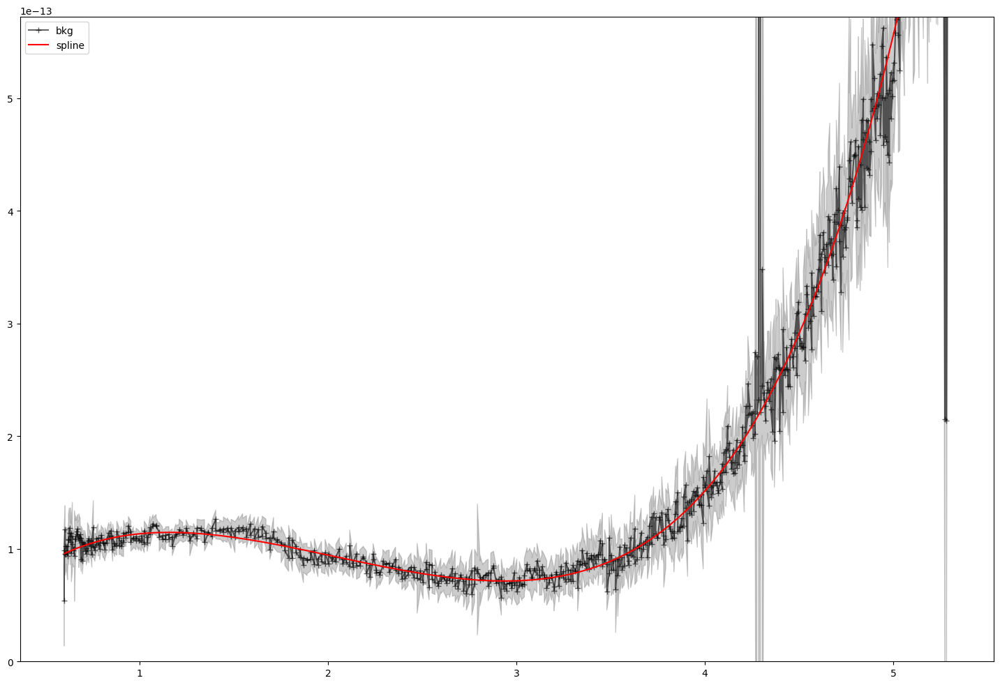

4


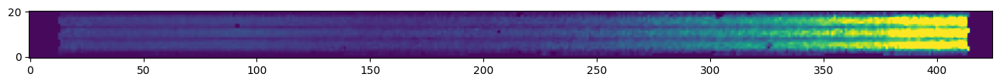

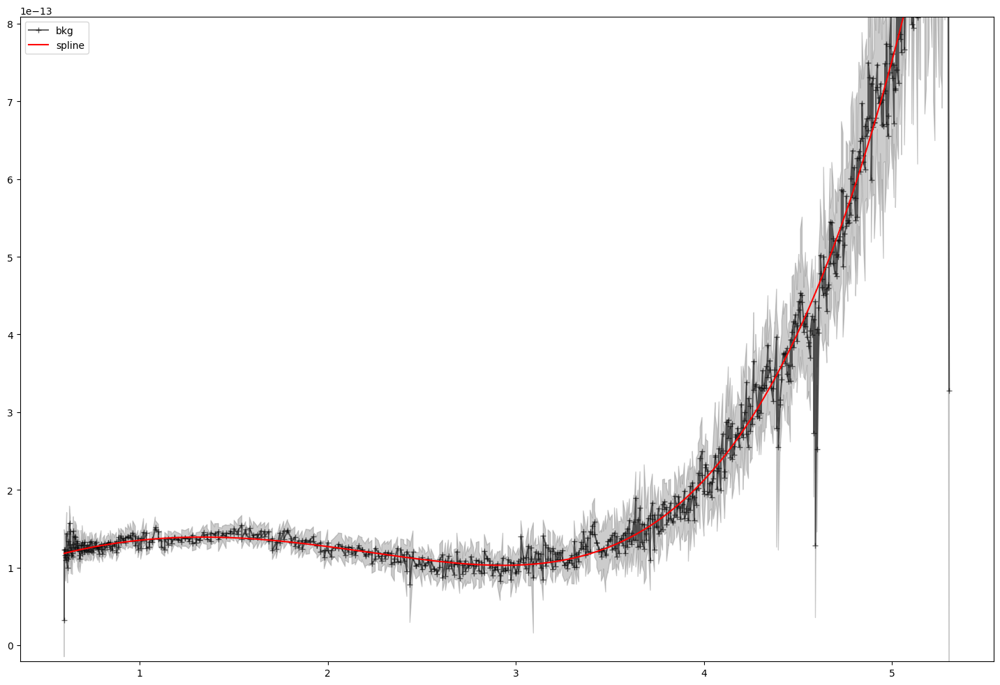

4


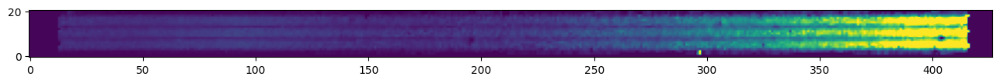

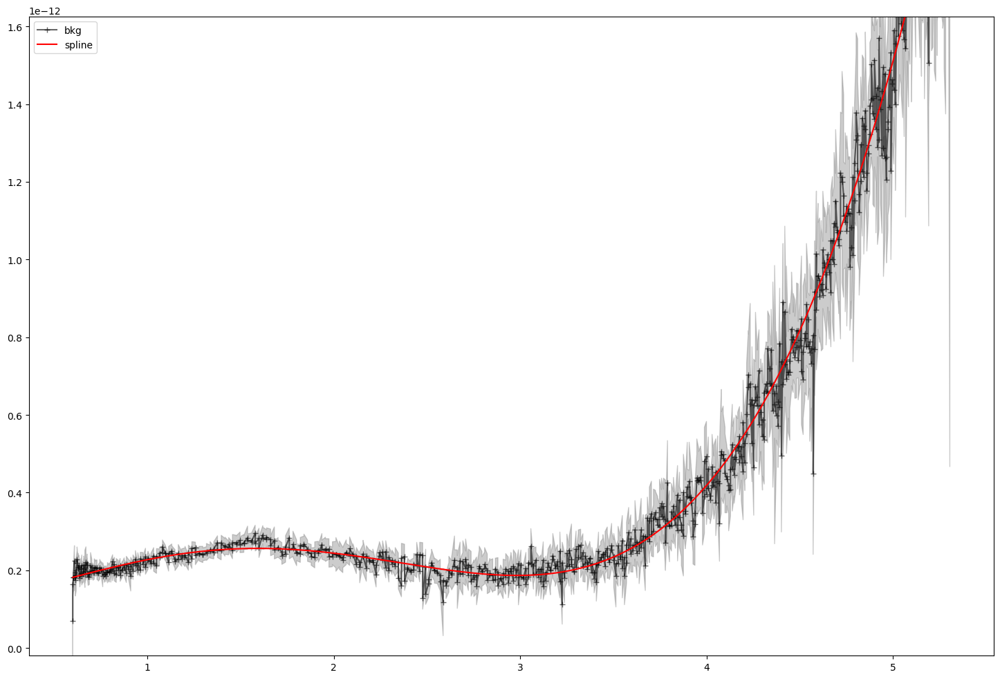

2024-05-26 23:02:30,311 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


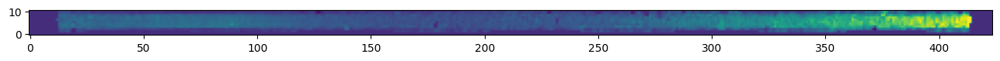

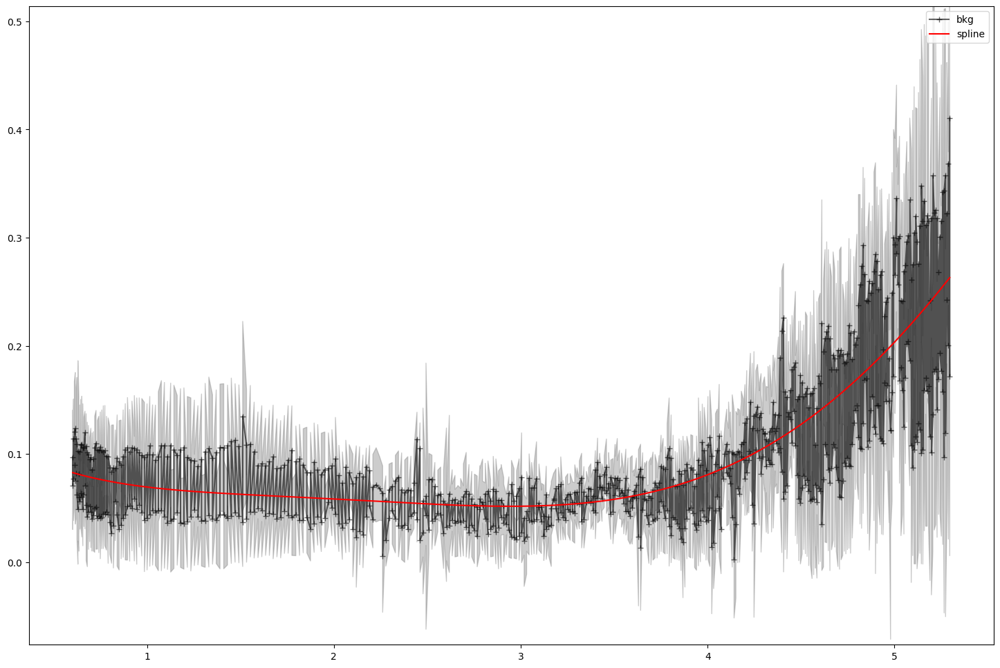

4


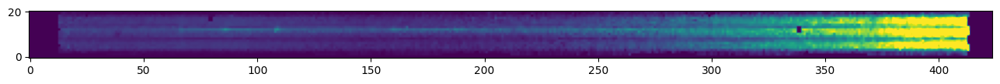

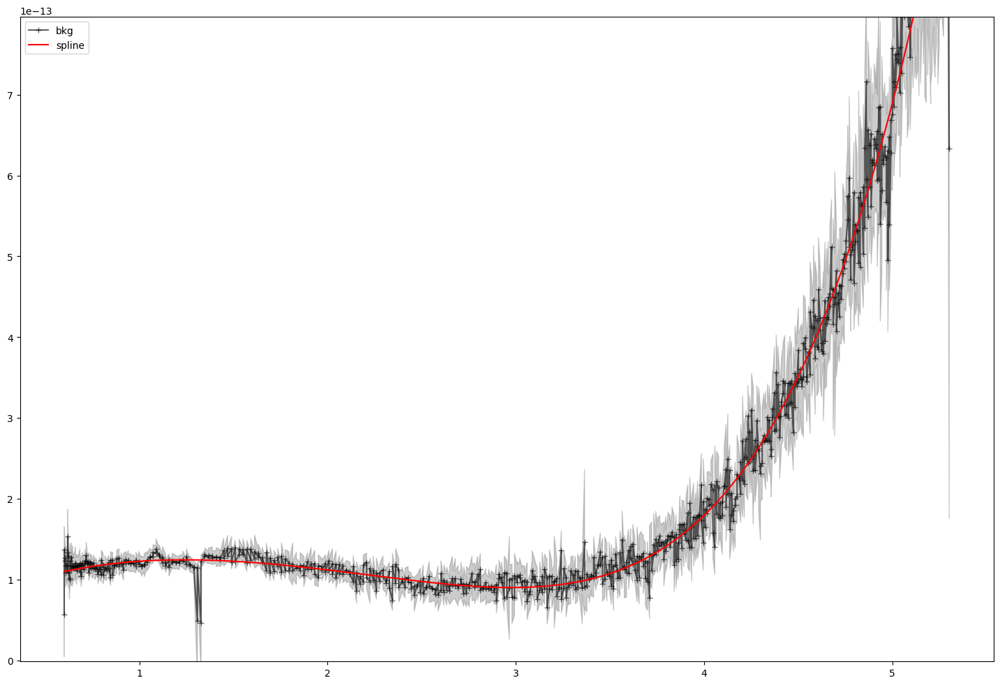

2024-05-26 23:02:38,587 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


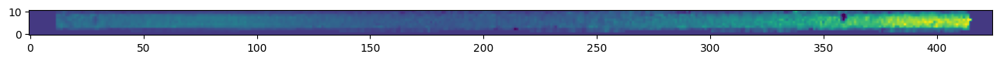

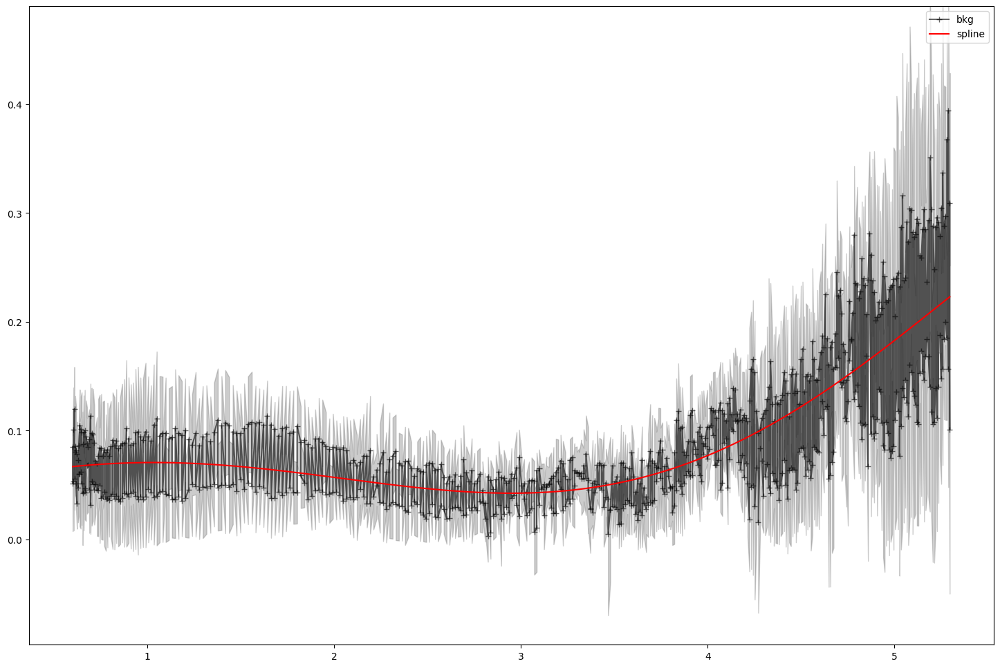

4


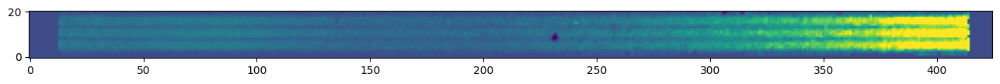

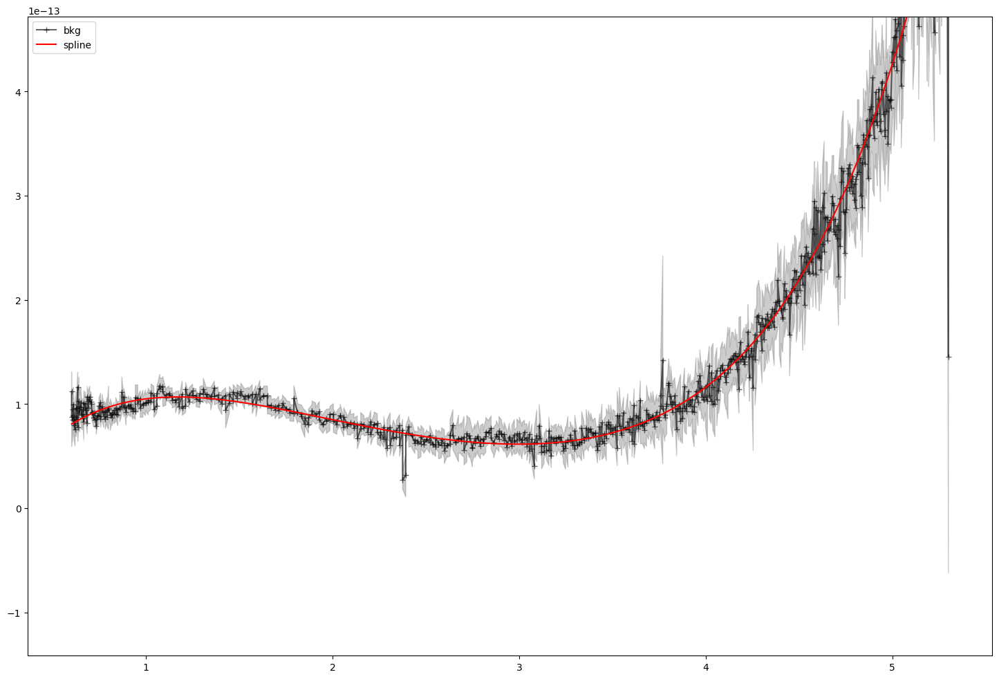

2024-05-26 23:02:41,636 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


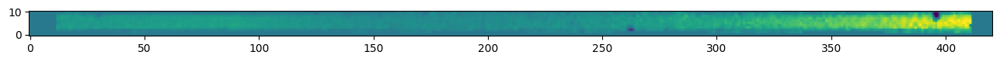

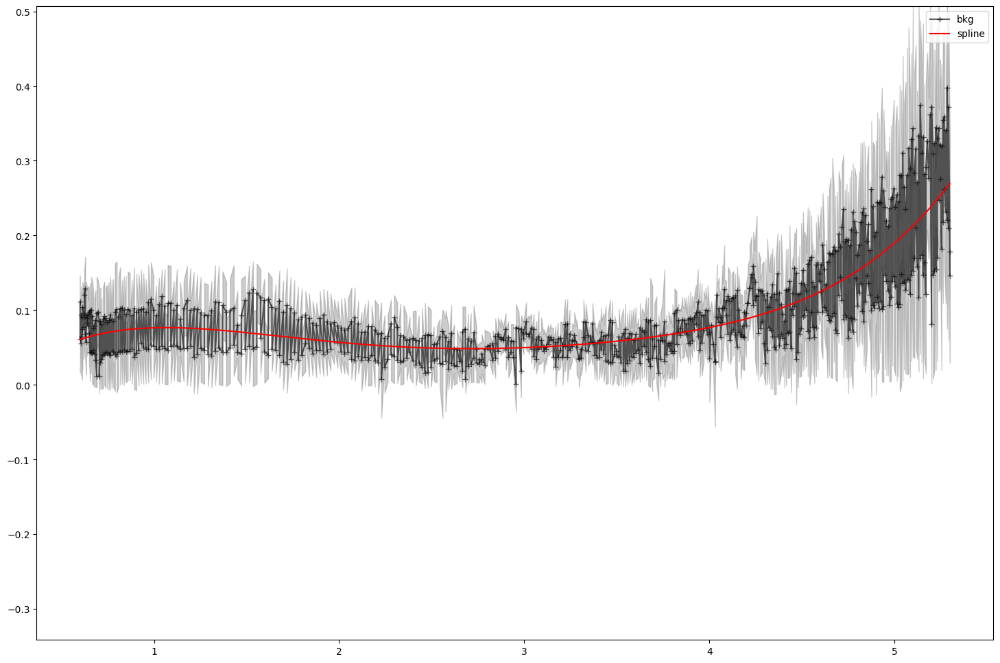

2024-05-26 23:02:43,192 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


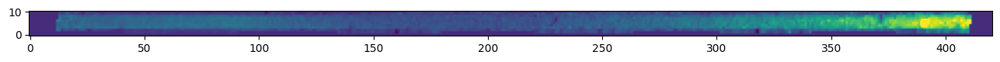

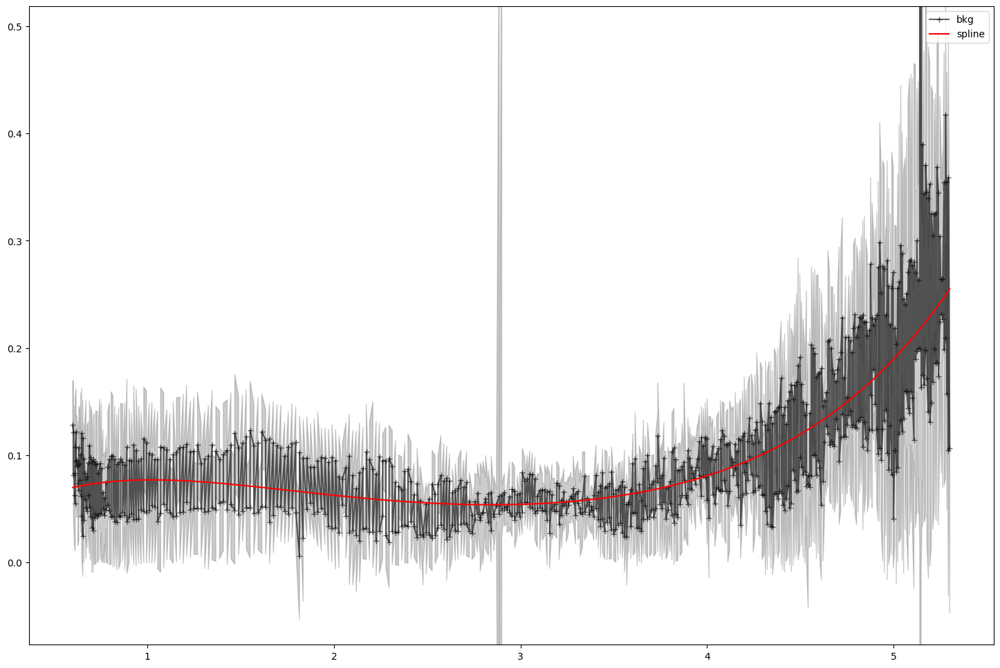

4


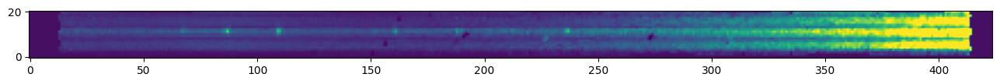

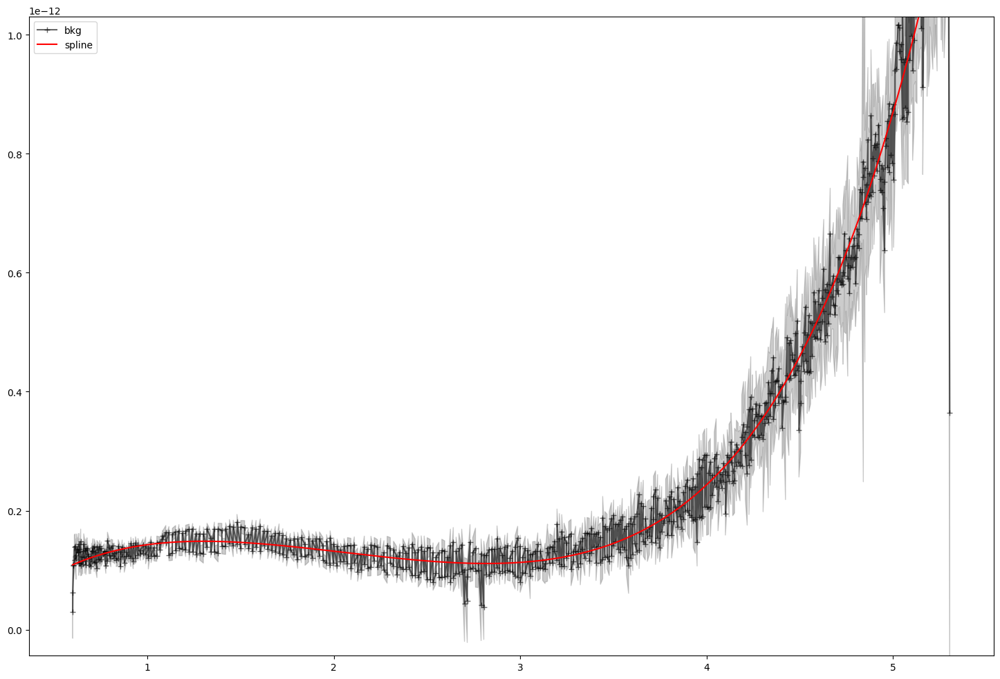

4


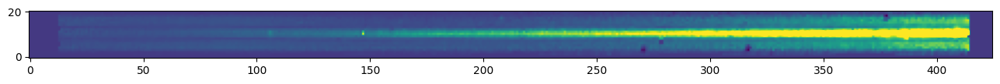

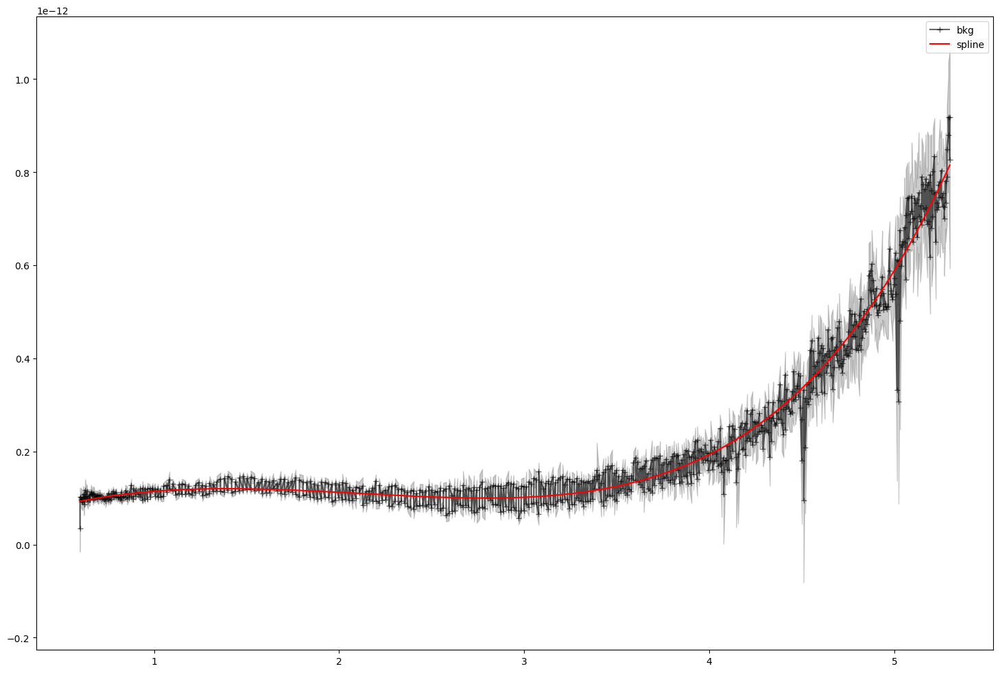

4


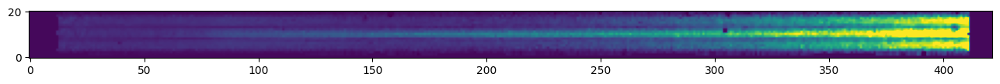

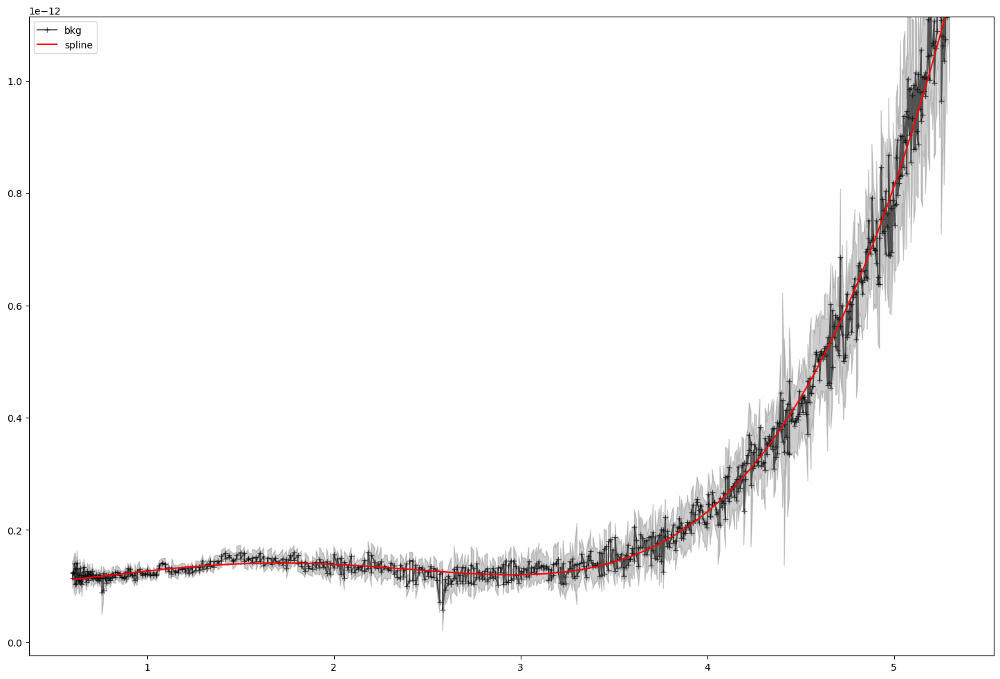

4


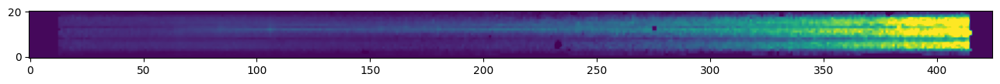

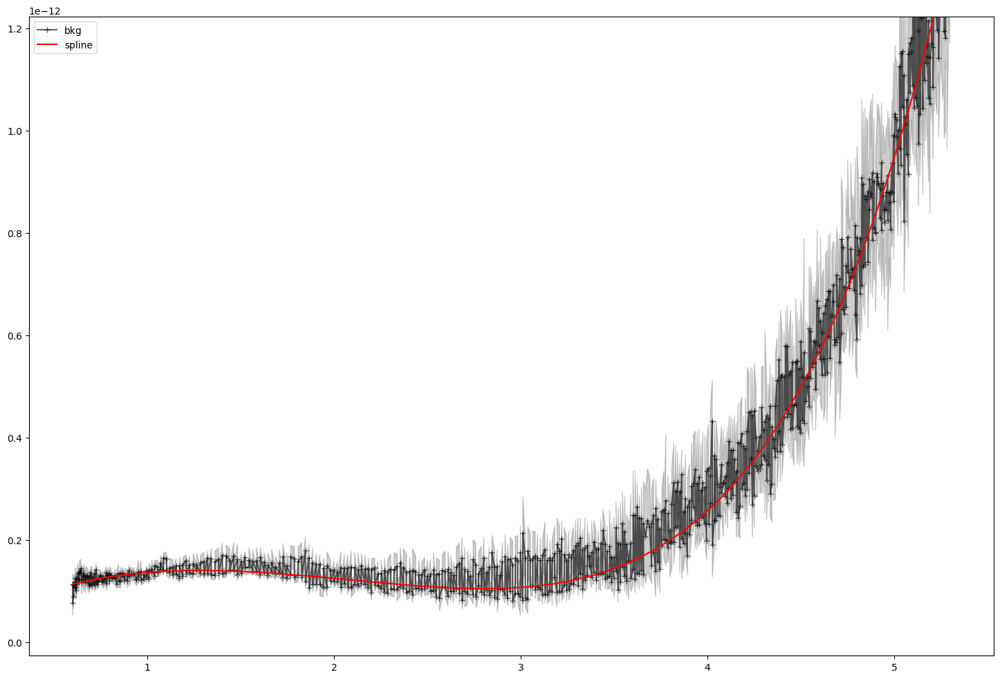

2024-05-26 23:02:51,537 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


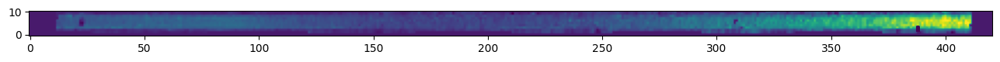

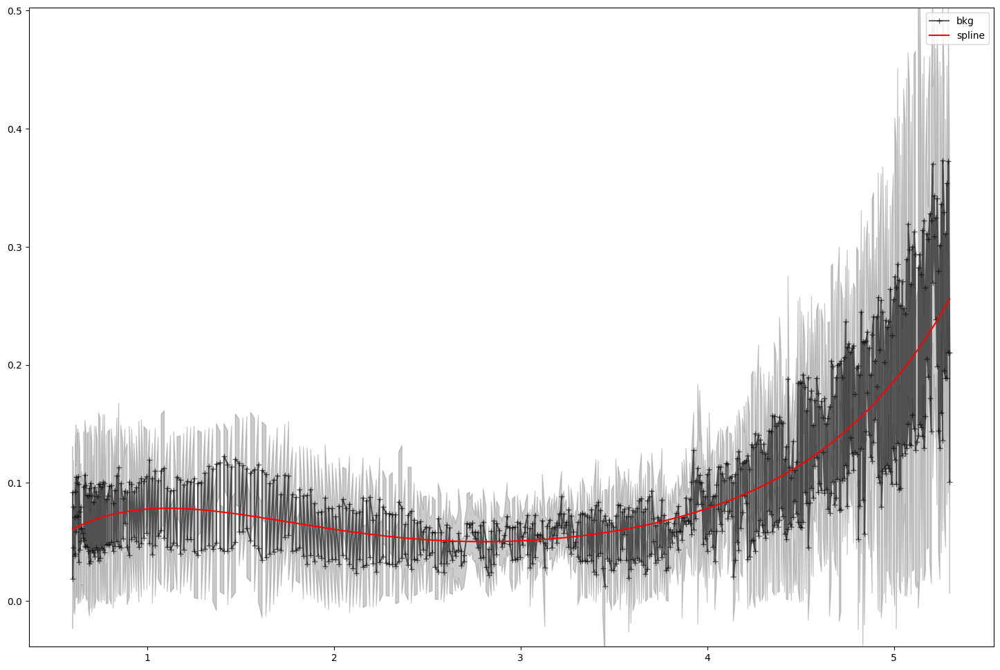

2024-05-26 23:02:53,067 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


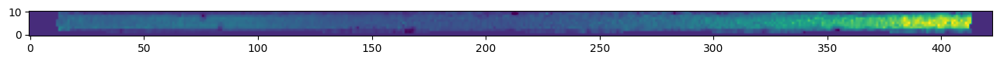

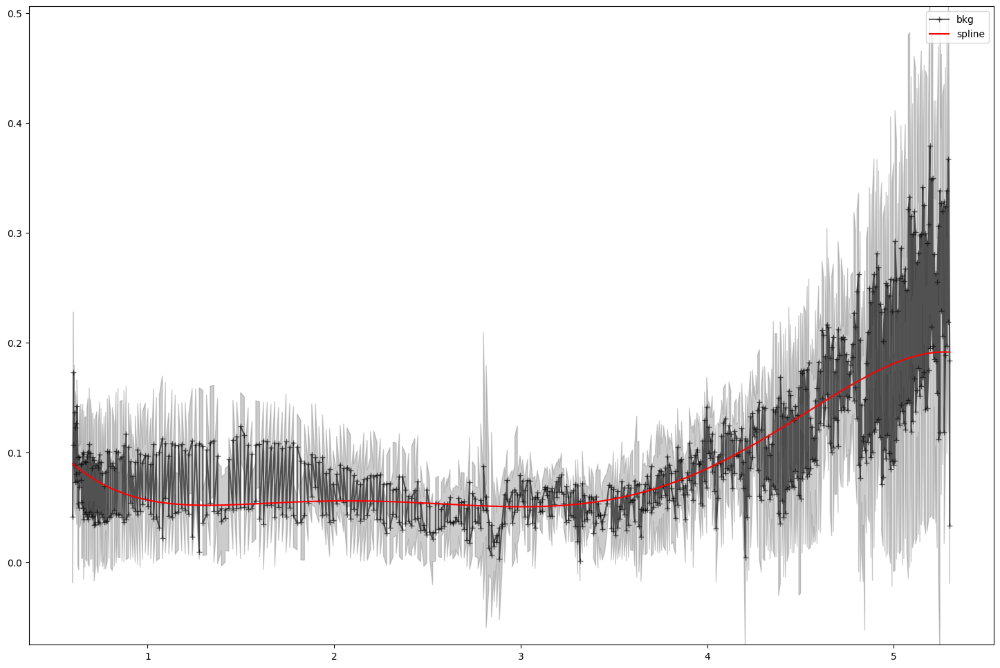

2024-05-26 23:02:54,594 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


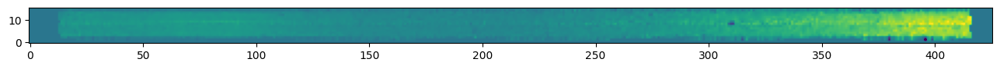

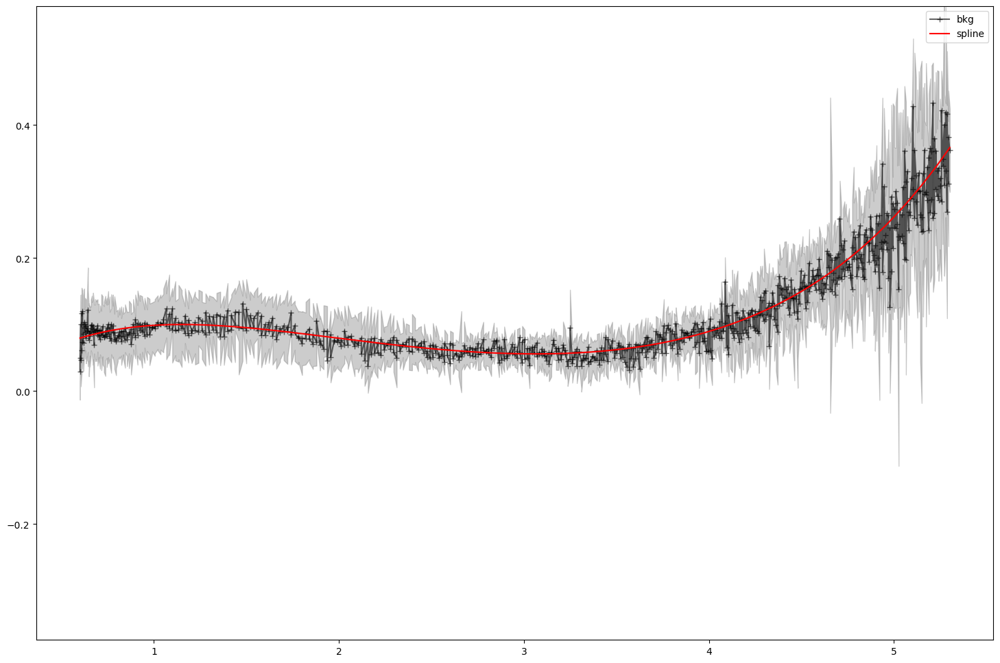

2024-05-26 23:02:56,116 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


2024-05-26 23:02:57,308 - stpipe - WARNING - /tmp/ipykernel_86/60350248.py:45: UserWarning: 
2024-05-26 23:02:57,308 - stpipe - WARNING - The maximal number of iterations maxit (set to 20 by the program)
2024-05-26 23:02:57,309 - stpipe - WARNING - allowed for finding a smoothing spline with fp=s has been reached: s
2024-05-26 23:02:57,310 - stpipe - WARNING - too small.
2024-05-26 23:02:57,311 - stpipe - WARNING - There is an approximation returned but the corresponding weighted sum
2024-05-26 23:02:57,311 - stpipe - WARNING - of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
2024-05-26 23:02:57,312 - stpipe - WARNING -   interp = interpolate.UnivariateSpline(x,y,w=w,s=0.01,k=5,check_finite=True)
2024-05-26 23:02:57,313 - stpipe - WARNING - 


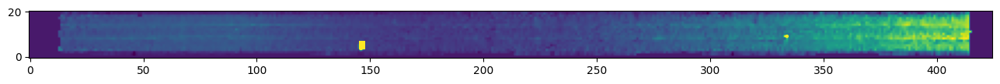

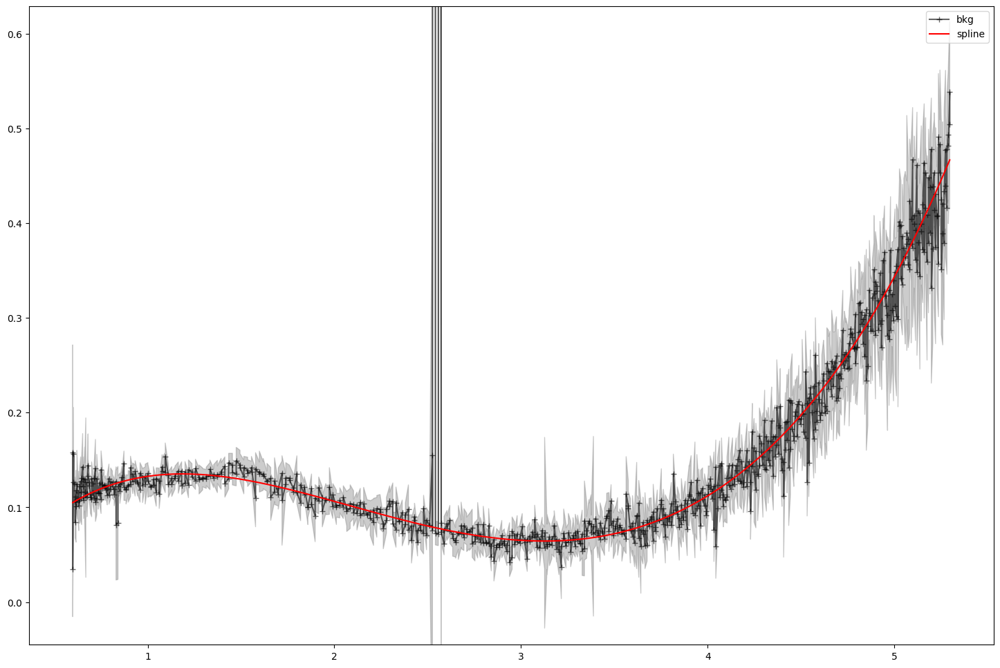

2024-05-26 23:02:57,758 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


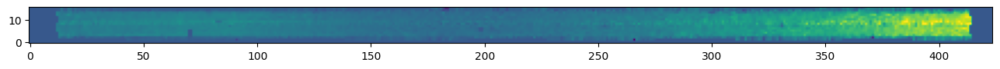

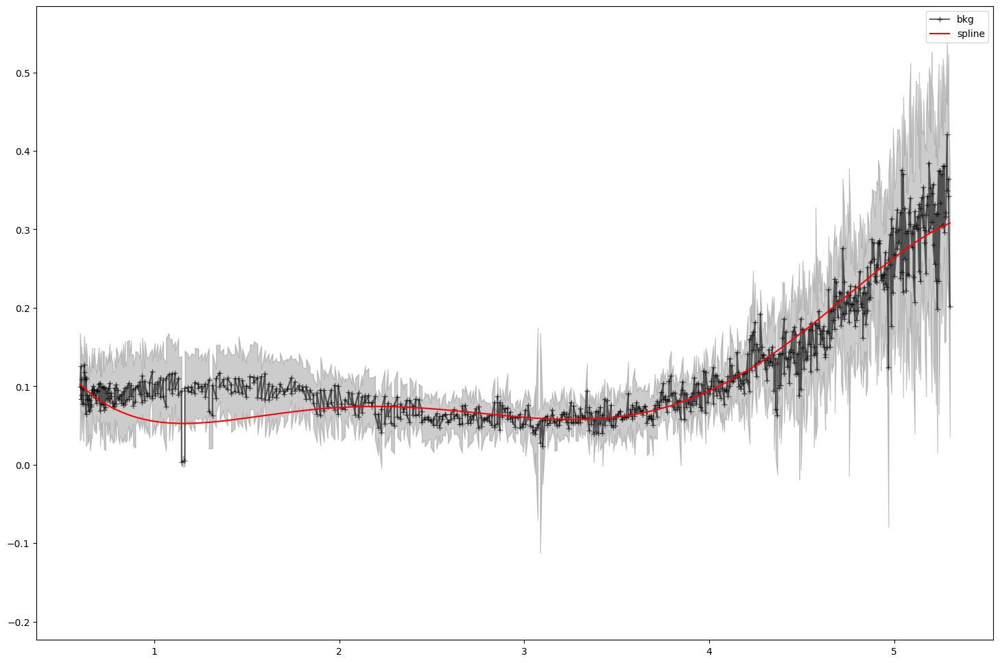

2024-05-26 23:02:59,259 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


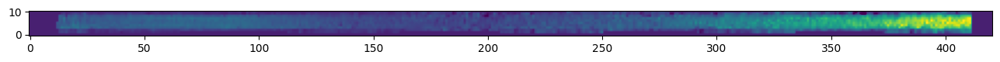

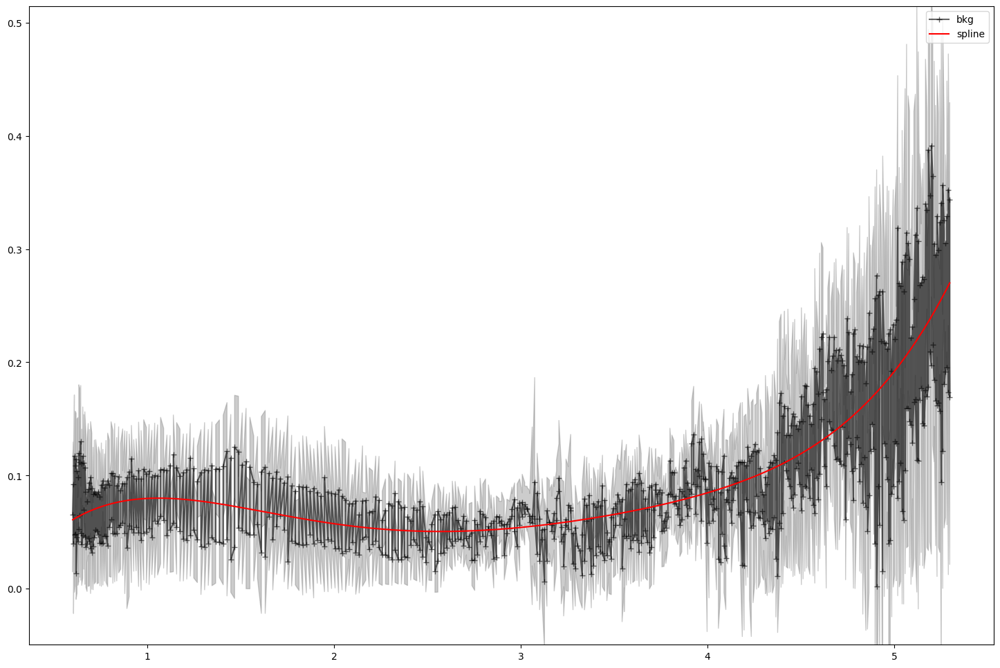

4


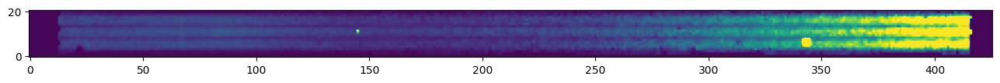

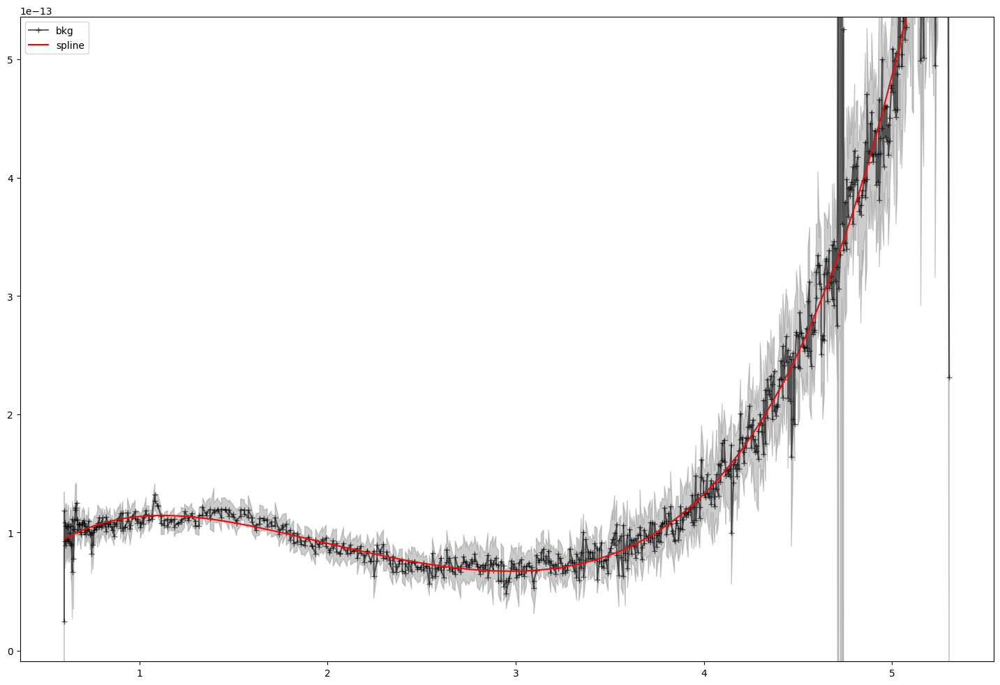

2024-05-26 23:03:02,999 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


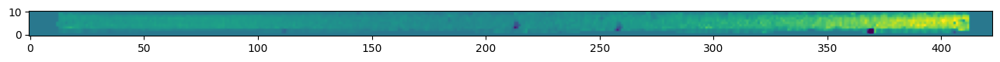

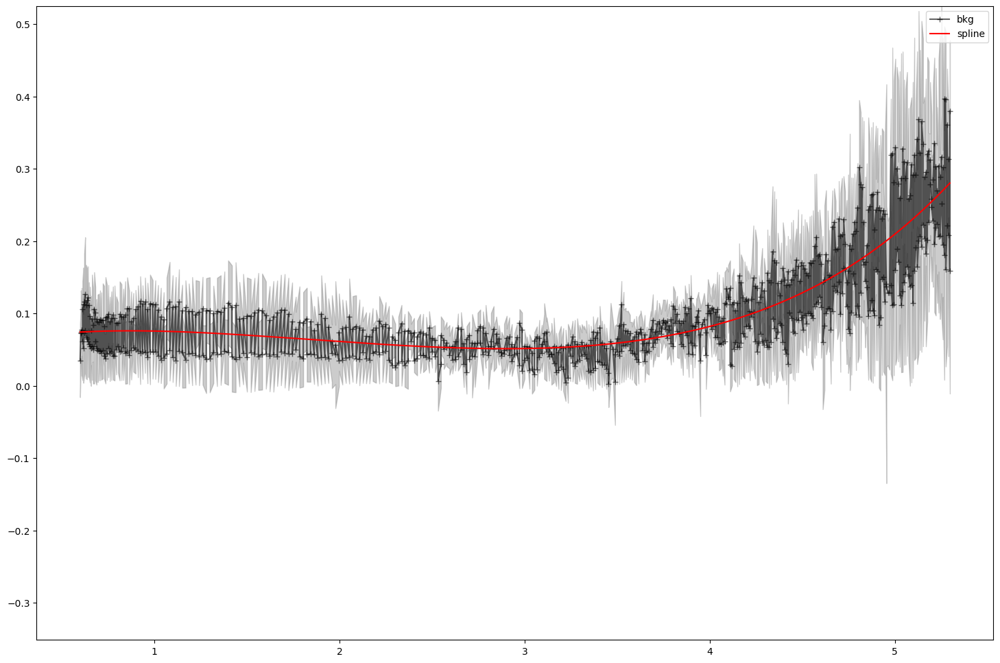

2024-05-26 23:03:04,617 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


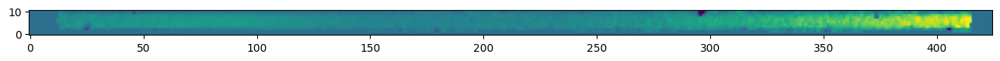

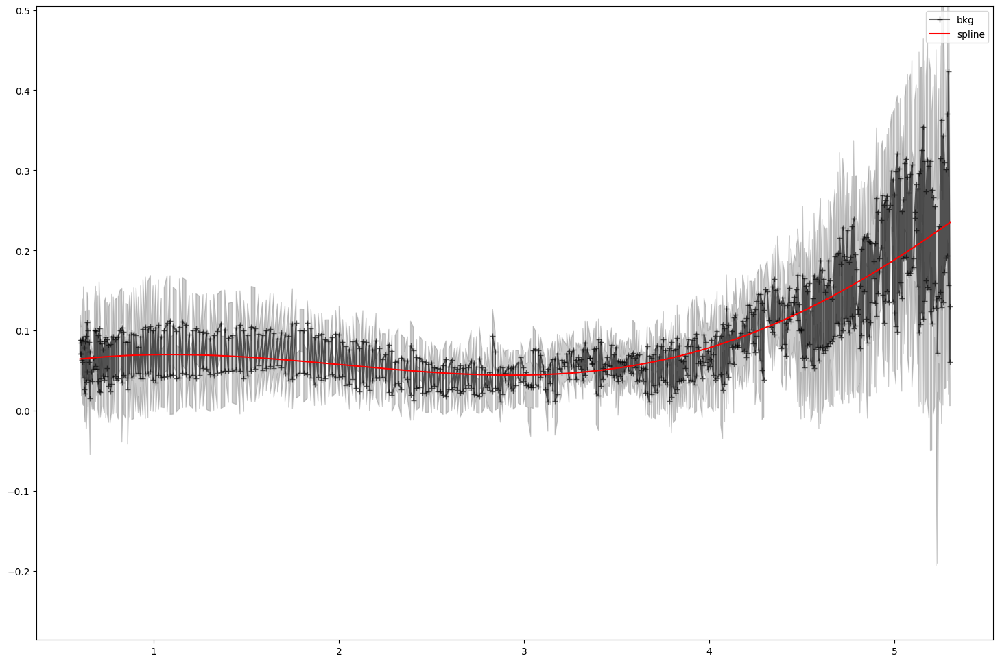

2024-05-26 23:03:06,139 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


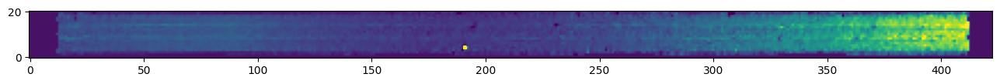

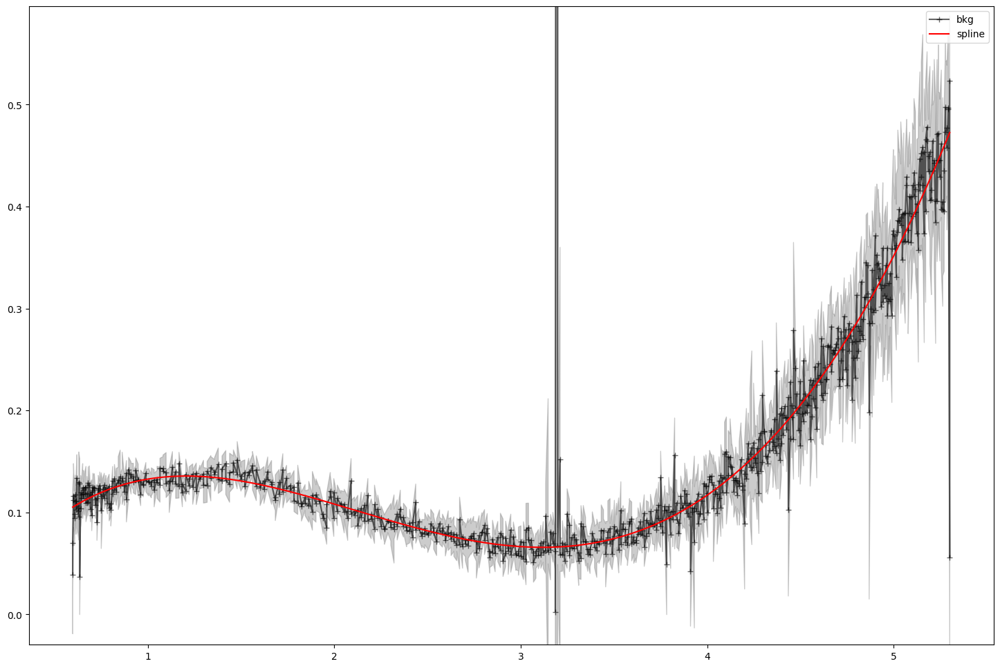

4


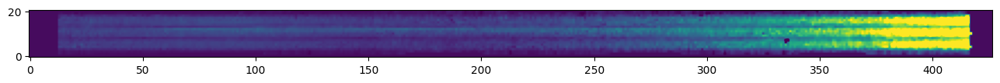

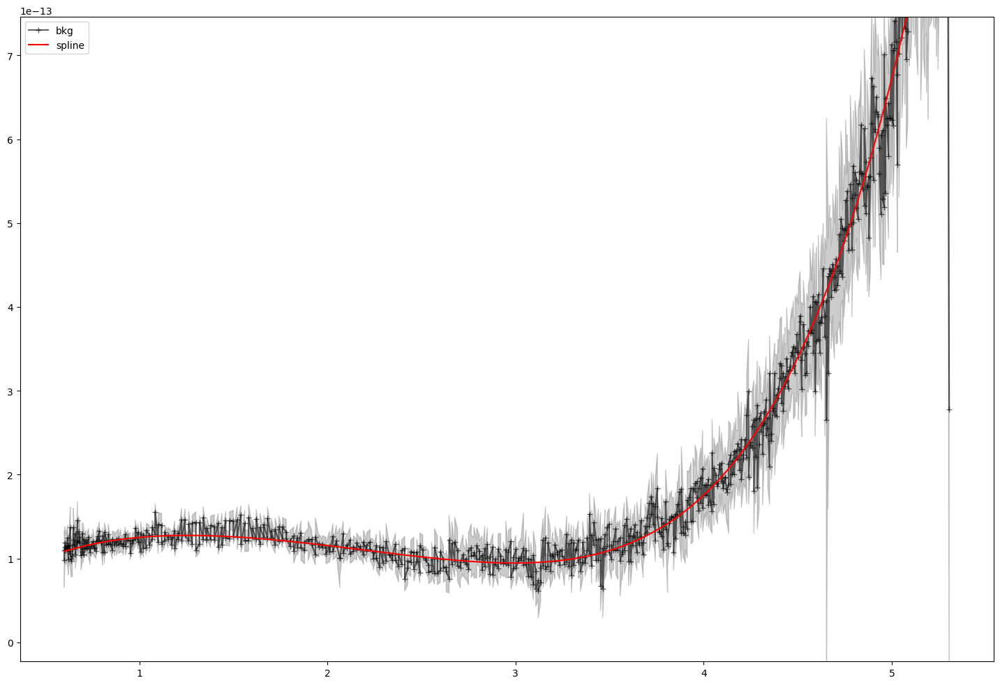

2024-05-26 23:03:09,294 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


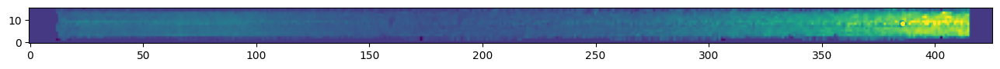

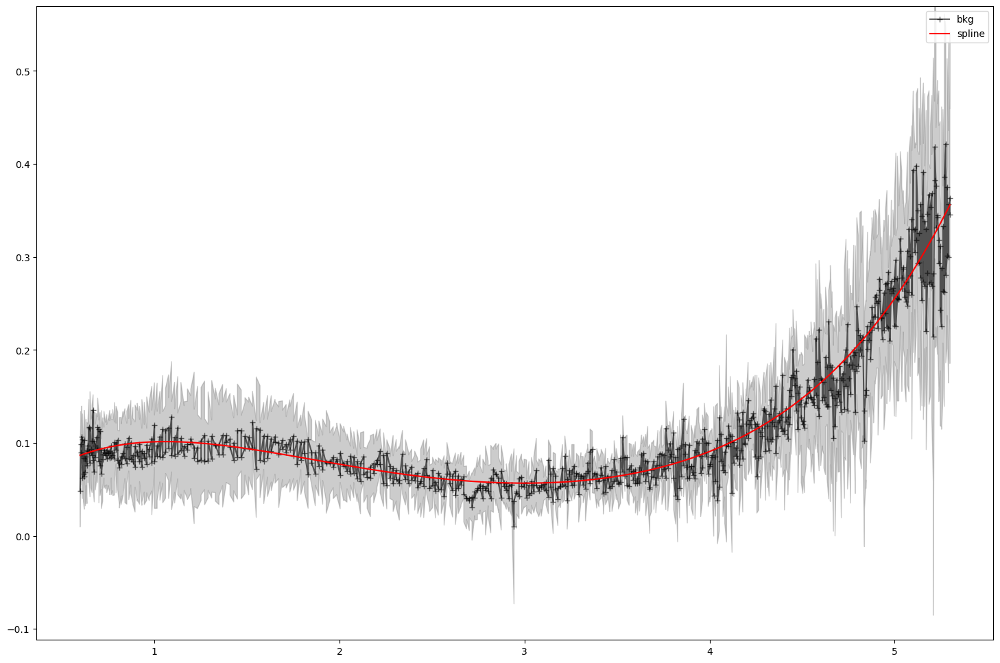

2024-05-26 23:03:10,823 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


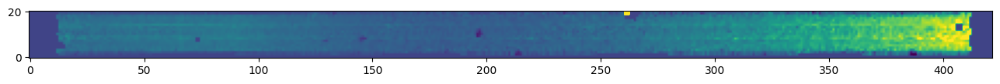

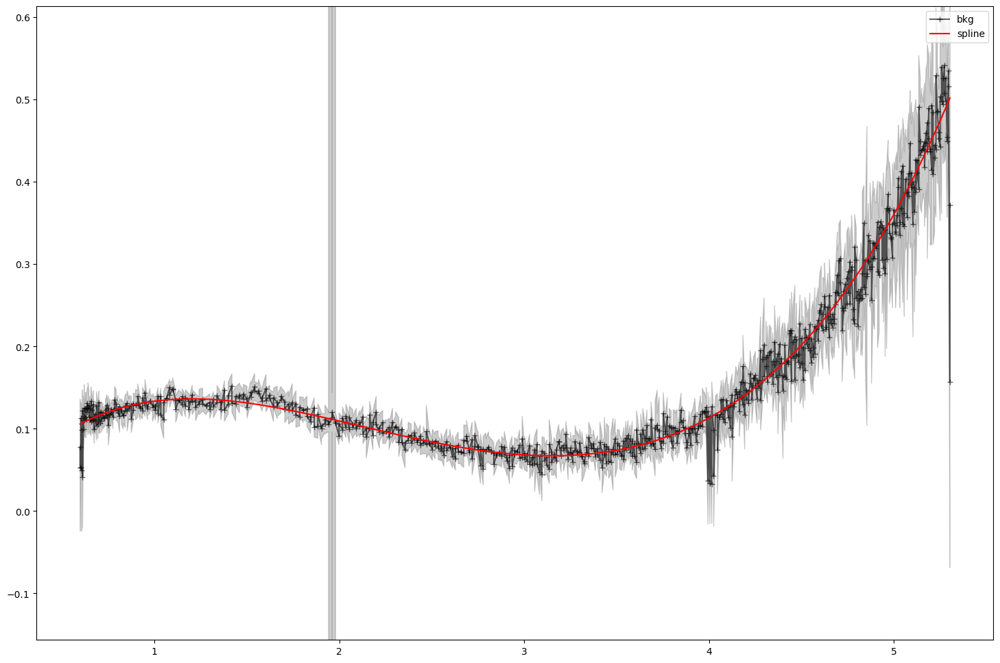

4


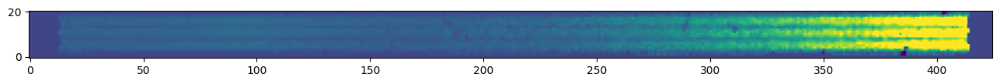

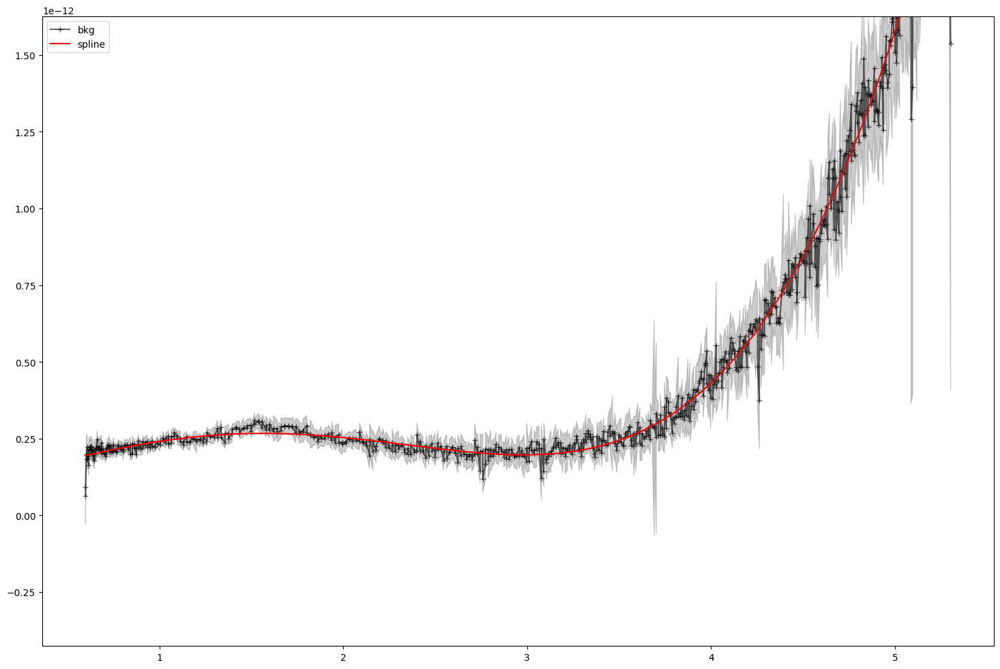

2024-05-26 23:03:13,794 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


2


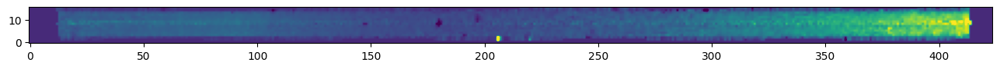

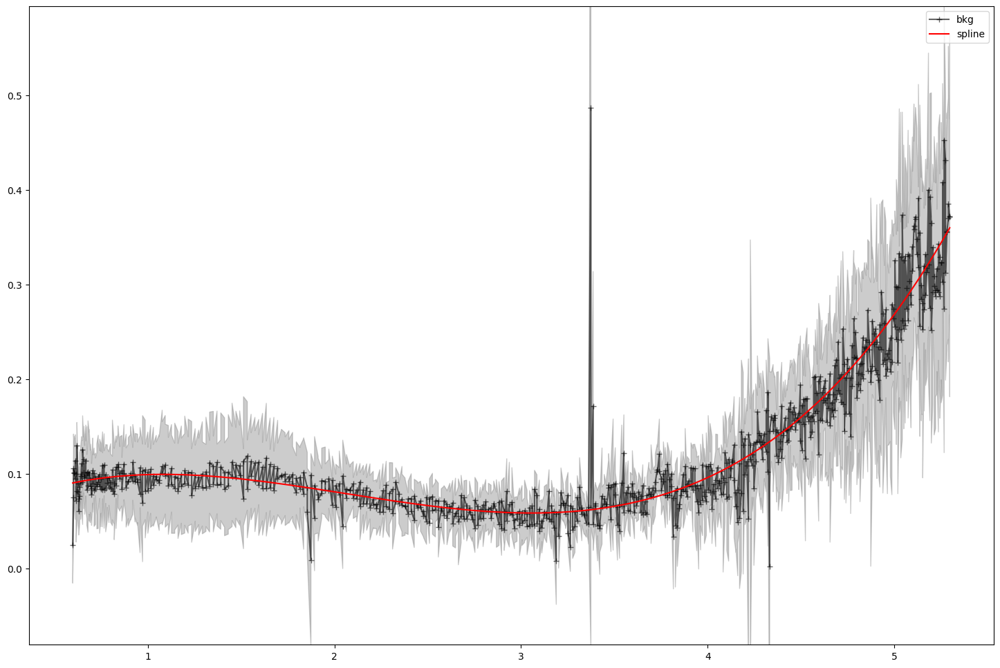

4


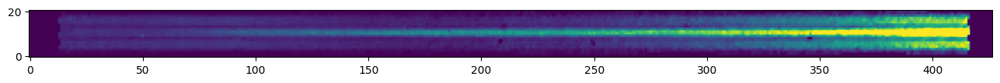

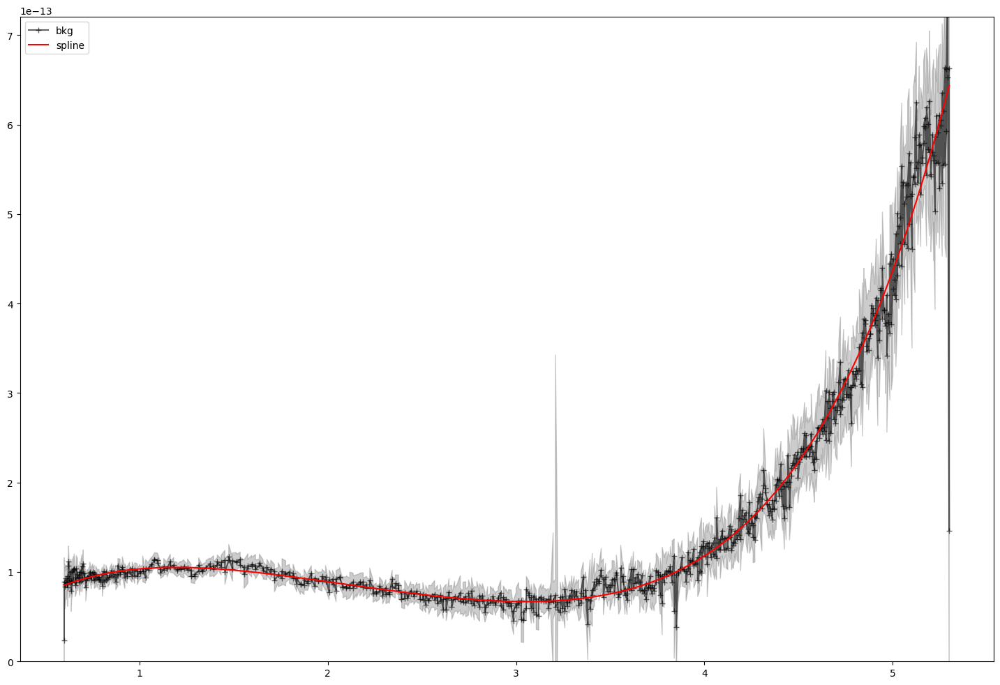

2024-05-26 23:03:17,027 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


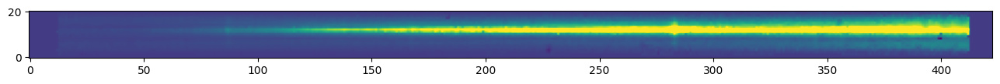

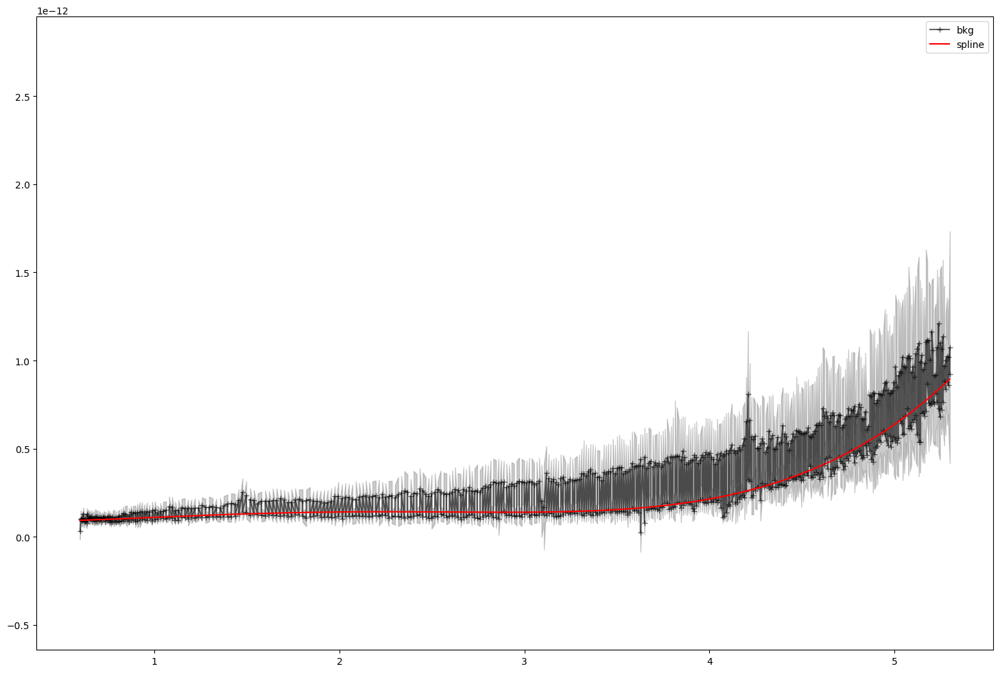

2024-05-26 23:03:18,482 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


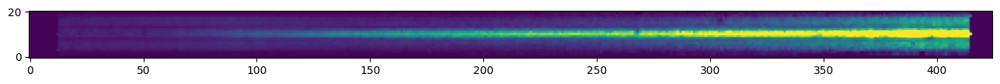

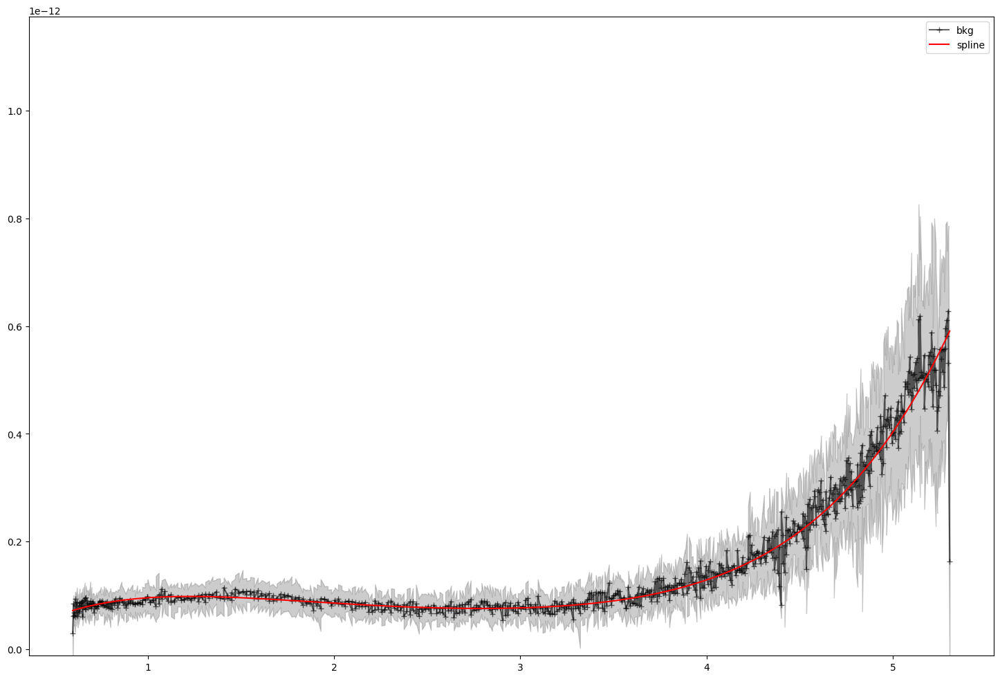

2024-05-26 23:03:20,009 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


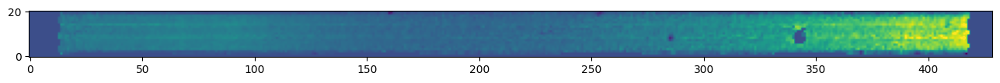

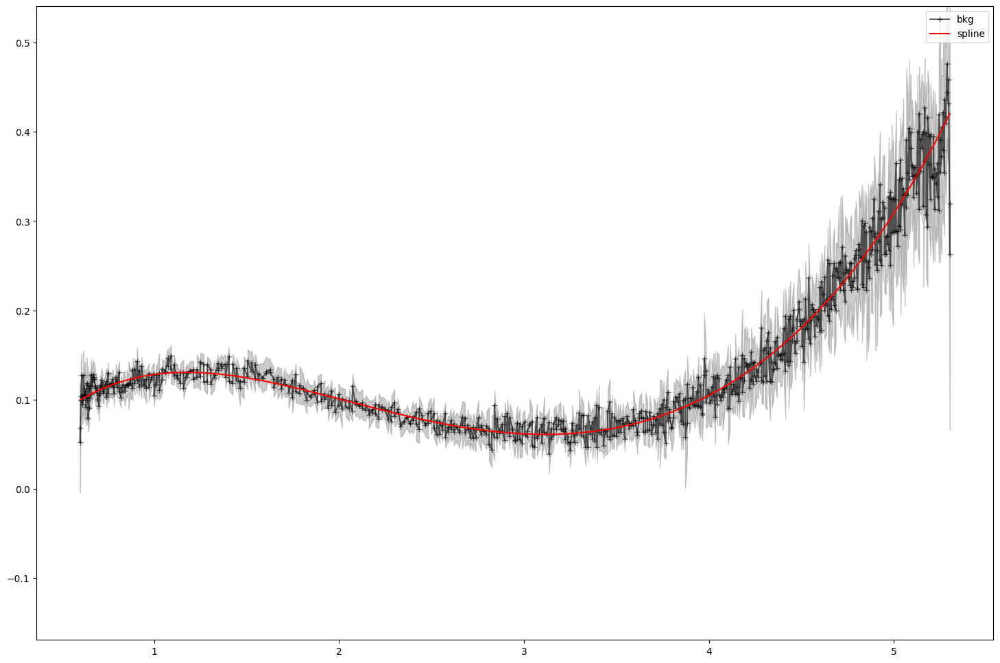

4


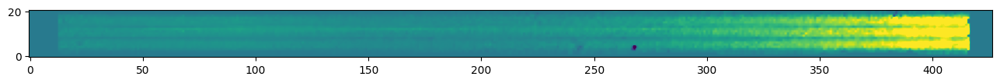

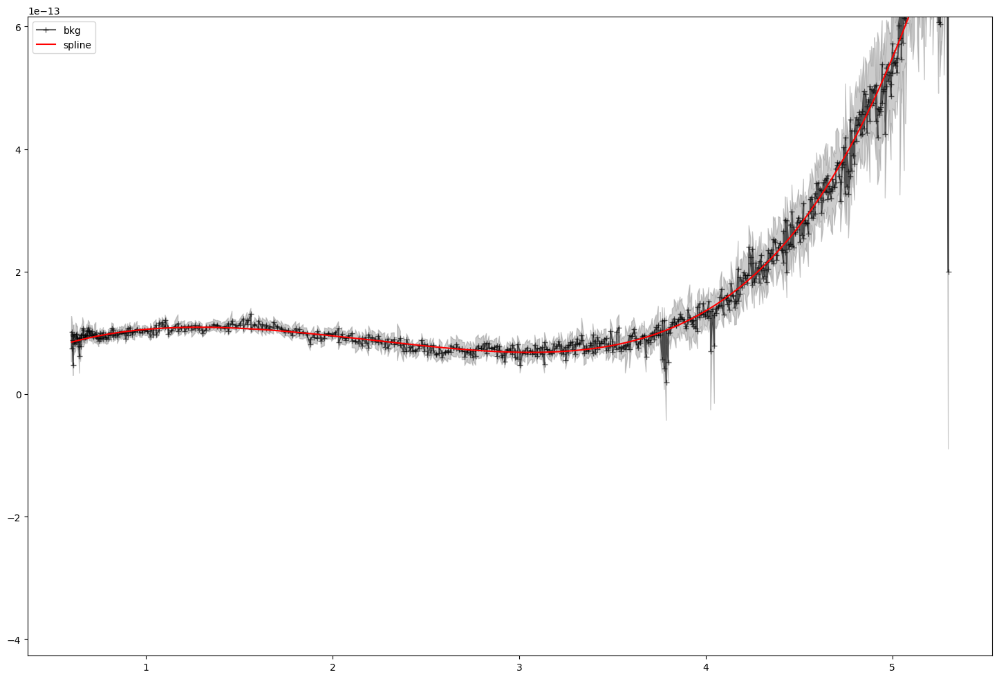

4


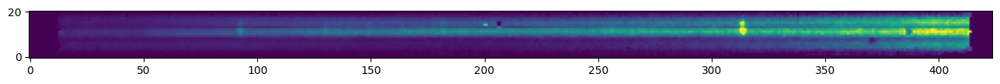

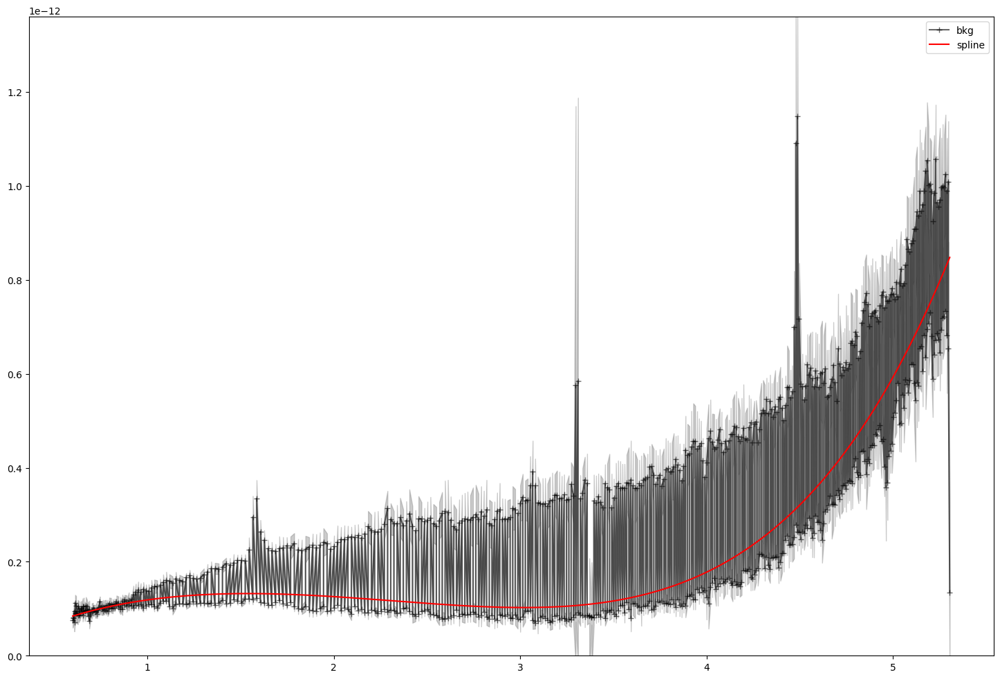

2024-05-26 23:03:24,552 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices


3


2024-05-26 23:03:25,819 - stpipe - WARNING - /tmp/ipykernel_86/60350248.py:45: UserWarning: 
2024-05-26 23:03:25,820 - stpipe - WARNING - The maximal number of iterations maxit (set to 20 by the program)
2024-05-26 23:03:25,820 - stpipe - WARNING - allowed for finding a smoothing spline with fp=s has been reached: s
2024-05-26 23:03:25,822 - stpipe - WARNING - too small.
2024-05-26 23:03:25,822 - stpipe - WARNING - There is an approximation returned but the corresponding weighted sum
2024-05-26 23:03:25,823 - stpipe - WARNING - of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
2024-05-26 23:03:25,823 - stpipe - WARNING -   interp = interpolate.UnivariateSpline(x,y,w=w,s=0.01,k=5,check_finite=True)
2024-05-26 23:03:25,824 - stpipe - WARNING - 


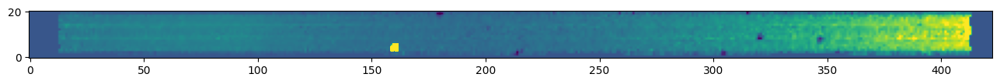

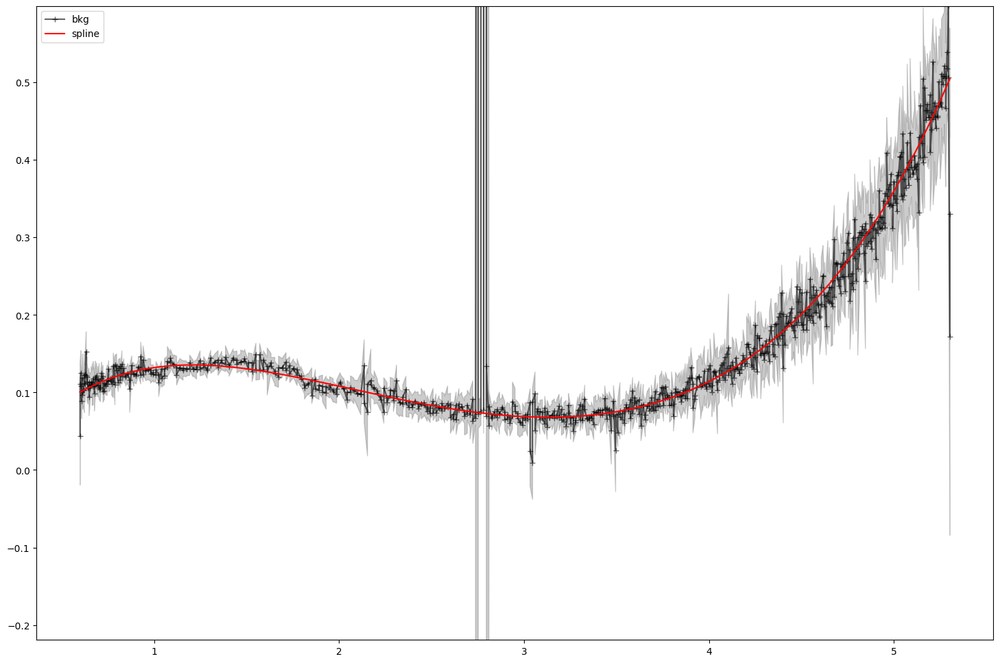

In [134]:
importlib.reload(BBSS)
for i in range(40):
    slices = BBSS.SelectSlice(resamped[i])
    Y,X = np.indices(resamped[i].data.shape)
    ra,dec,lamb = resamped[i].meta.wcs.transform("detector","world",X,Y)

    x = np.append(lamb[slices[0][0]:slices[0][1]].mean(axis=0),
                  lamb[slices[2][0]:slices[2][1]].mean(axis=0))


    print(slices[0,0])
    
    y = np.append(resamped[i].data[slices[0][0]:slices[0][1]].mean(axis=0),
                  resamped[i].data[slices[2][0]:slices[2][1]].mean(axis=0))
    dy = np.append(resamped[i].data[slices[0][0]:slices[0][1]].std(axis=0),
                  resamped[i].data[slices[2][0]:slices[2][1]].std(axis=0))
    
    dy = dy**2
    dy += np.append((resamped[i].err[slices[0][0]:slices[0][1]]**2).mean(axis=0),
                    (resamped[i].err[slices[2][0]:slices[2][1]]**2).mean(axis=0))
    dy = np.sqrt(dy)

    indices = np.argsort(x)
    x = x[indices]
    y = y[indices]
    dy = dy[indices]
    x = x[y>0]
    dy = dy[y>0]
    y = y[y>0]
    w = 1/dy
    w /= w.mean()

    
    plt.figure(figsize=(16,4))
    z = ZScaleInterval()
    z1,z2 = z.get_limits(resamped[i].data)
    plt.imshow(resamped[i].data,origin='lower',vmin=z1,vmax=z2)

    plt.figure(figsize=(18,12))
    plt.plot(x,y,marker="+",alpha=0.6,label="bkg",color="k")
    plt.ylim(z1,z2)
    plt.fill_between(x,y+dy,y-dy,alpha=0.4,color="gray")
    
    
    interp = interpolate.UnivariateSpline(x,y,w=w,s=0.01,k=5,check_finite=True)
    fitted = interp(np.linspace(x.min(),x.max(),300))
    if not np.all(np.isfinite(fitted)):
        interp = interpolate.UnivariateSpline(x,y,w=w,s=1,k=5,check_finite=True)
        fitted = interp(np.linspace(x.min(),x.max(),300))
    plt.plot(np.linspace(x.min(),x.max(),300),fitted,color='red',label='spline')

    plt.legend()
    plt.show()

# Difference background fit between images

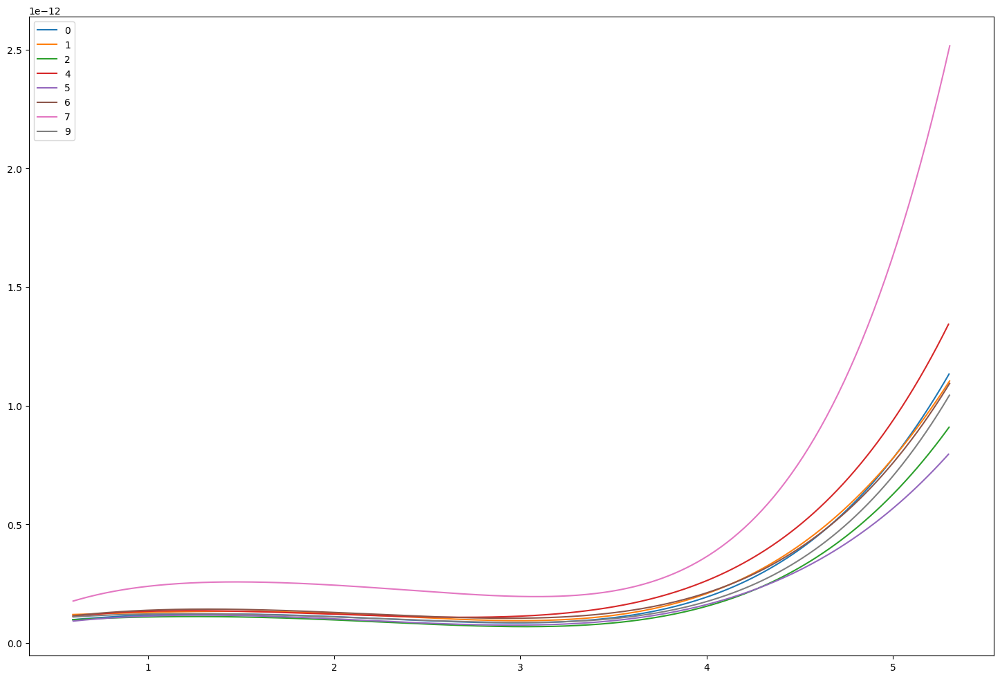

In [109]:
importlib.reload(BBSS)
plt.figure(figsize=(18,12))
for i in range(10):
    if i == 3 or i == 8:
        continue
    slices = BBSS.SelectSlice(resamped[i])
    Y,X = np.indices(resamped[i].data.shape)
    ra,dec,lamb = resamped[i].meta.wcs.transform("detector","world",X,Y)

    x = np.append(lamb[slices[0][0]:slices[0][1]].mean(axis=0),
                  lamb[slices[2][0]:slices[2][1]].mean(axis=0))


    y = np.append(resamped[i].data[slices[0][0]:slices[0][1]].mean(axis=0),
                  resamped[i].data[slices[2][0]:slices[2][1]].mean(axis=0))
    dy = np.append(resamped[i].data[slices[0][0]:slices[0][1]].std(axis=0),
                  resamped[i].data[slices[2][0]:slices[2][1]].std(axis=0))

    indices = np.argsort(x)
    x = x[indices]
    y = y[indices]
    dy = dy[indices]
    x = x[y>0]
    dy = dy[y>0]
    y = y[y>0]
    w = 1/dy
    w[~np.isfinite(w)] = 0
    w /= w.mean()
    
    
    interp = interpolate.UnivariateSpline(x,y,w=w,s=1,k=5,check_finite=True)
    fitted = interp(np.linspace(x.min(),x.max(),300))
    plt.plot(np.linspace(x.min(),x.max(),300),fitted,label=i)

plt.legend()
plt.show()

# 1st draft algorithm, no uncalibration

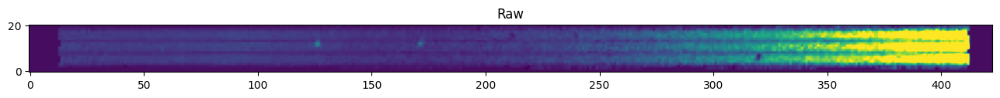

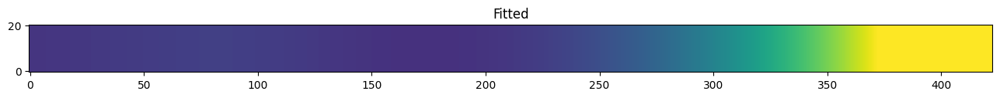

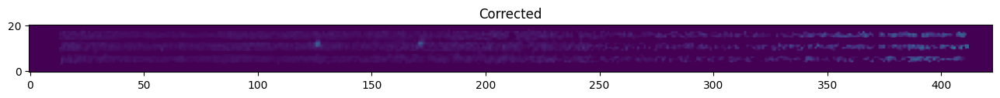

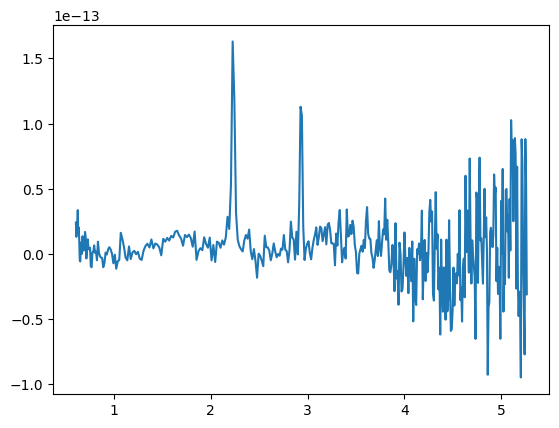

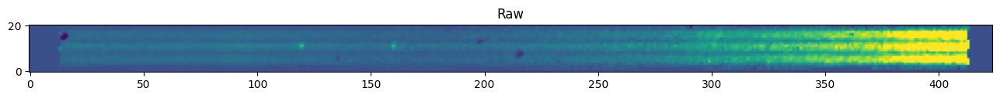

...

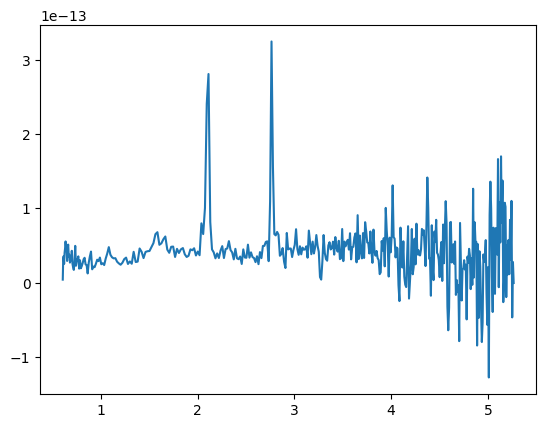

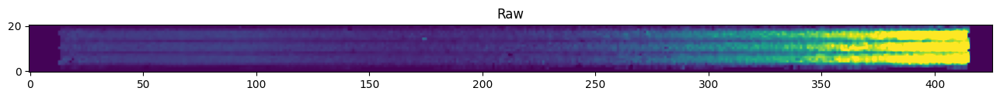

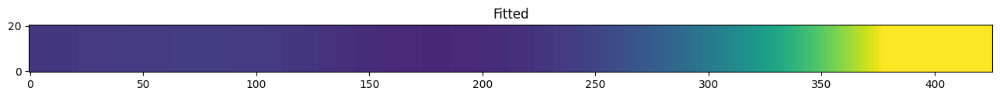

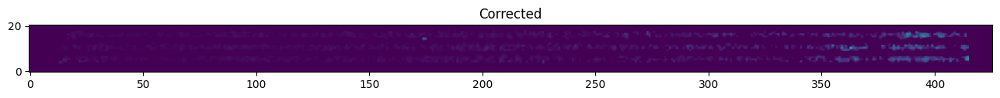

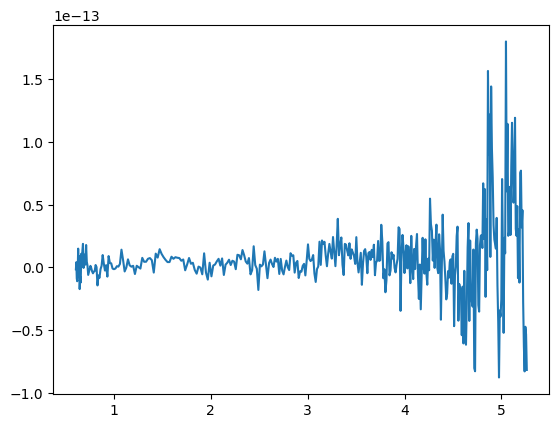

2024-05-26 22:28:35,210 - stpipe - WARNING -  - [BetterBackground]  : Can't find 3 spectra. Defaulting to equal slices
2024-05-26 22:28:36,436 - stpipe - WARNING - /tmp/ipykernel_86/2650868484.py:38: UserWarning: 
2024-05-26 22:28:36,437 - stpipe - WARNING - The maximal number of iterations maxit (set to 20 by the program)
2024-05-26 22:28:36,438 - stpipe - WARNING - allowed for finding a smoothing spline with fp=s has been reached: s
2024-05-26 22:28:36,439 - stpipe - WARNING - too small.
2024-05-26 22:28:36,439 - stpipe - WARNING - There is an approximation returned but the corresponding weighted sum
2024-05-26 22:28:36,440 - stpipe - WARNING - of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
2024-05-26 22:28:36,441 - stpipe - WARNING -   interp = interpolate.UnivariateSpline(x,y,w=w,s=0.01,k=5,check_finite=True)
2024-05-26 22:28:36,442 - stpipe - WARNING - 


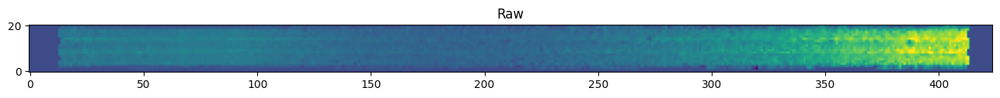

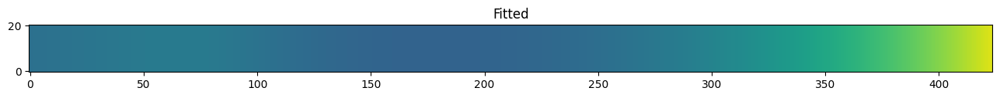

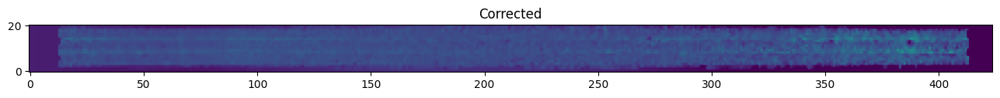

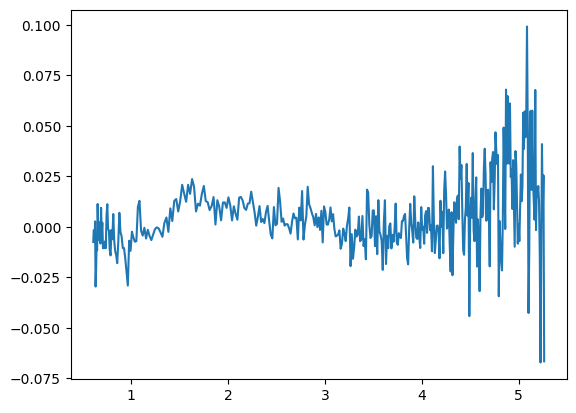

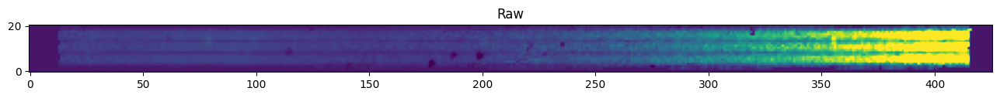

...

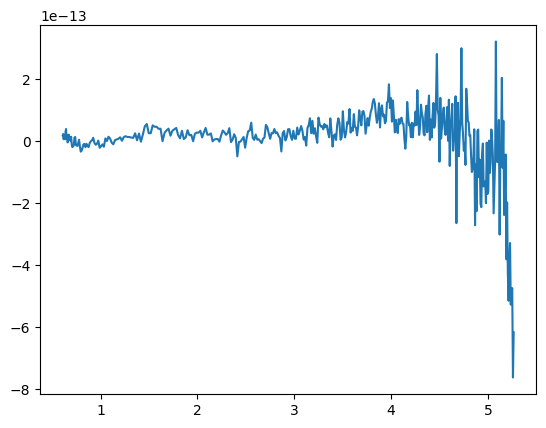

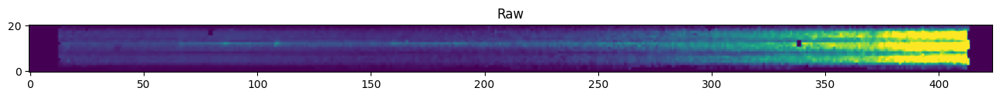

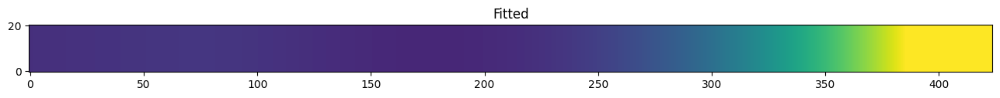

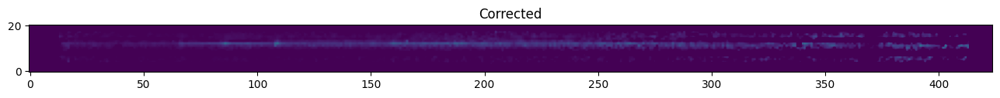

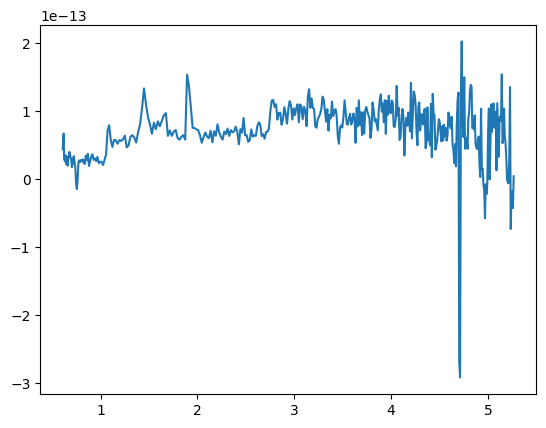

In [126]:
importlib.reload(BBSS)
for i in range(10):
    if len(resamped[i].shutter_state) != 3:
        continue
    slices = BBSS.SelectSlice(resamped[i])
    Y,X = np.indices(resamped[i].data.shape)
    _,_,lamb = resamped[i].meta.wcs.transform("detector","world",X,Y)

    x = np.append(lamb[slices[0][0]:slices[0][1]].mean(axis=0),
                  lamb[slices[2][0]:slices[2][1]].mean(axis=0))


    y = np.append(resamped[i].data[slices[0][0]:slices[0][1]].mean(axis=0),
                  resamped[i].data[slices[2][0]:slices[2][1]].mean(axis=0))
    
    dy = np.append(resamped[i].data[slices[0][0]:slices[0][1]].std(axis=0),
                  resamped[i].data[slices[2][0]:slices[2][1]].std(axis=0))

    indices = np.argsort(x)
    x = x[indices]
    y = y[indices]
    dy = dy[indices]
    x = x[y>0]
    dy = dy[y>0]
    y = y[y>0]
    w = 1/dy
    w[~np.isfinite(w)] = 0
    w /= w.mean()

    
    plt.figure(figsize=(16,4))
    z = ZScaleInterval()
    z1,z2 = z.get_limits(resamped[i].data)
    plt.imshow(resamped[i].data,origin='lower',vmin=z1,vmax=z2)
    plt.title("Raw")
    
    
    interp = interpolate.UnivariateSpline(x,y,w=w,s=0.01,k=5,check_finite=True)
    fitted = interp(np.linspace(x.min(),x.max(),10))
    if not np.all(np.isfinite(fitted)):
        interp = interpolate.UnivariateSpline(x,y,w=w,s=1,k=5,check_finite=True)
        
    fitted = interp(lamb)
    
    plt.figure(figsize=(16,4))
    plt.imshow(fitted,origin='lower',vmin=z1,vmax=z2)
    plt.title("Fitted")
    
    plt.figure(figsize=(16,4))
    plt.imshow(resamped[i].data - fitted,origin='lower',vmin=z1,vmax=z2)
    plt.title("Corrected")
    
    x = lamb[slices[1][0]:slices[1][1]].mean(axis=0)[15:-15]
    y = (resamped[i].data - fitted)[slices[1][0]:slices[1][1]].mean(axis=0)[15:-15]
    plt.figure()
    plt.plot(x,y)
    
    plt.show()
    

# Precal of data

In [2]:
srctype = dm.open("./mastDownload/JWST/CEERS-NIRSPEC-P5-PRISM-MSATA/jw01345063001_03101_00001_nrs1_srctype.fits")
bkg = dm.open("./mastDownload/JWST/CEERS-NIRSPEC-P5-PRISM-MSATA/jw01345063001_03101_00001_nrs1_bkg.fits")
back = dm.open("./mastDownload/JWST/CEERS-NIRSPEC-P5-PRISM-MSATA/jw01345063001_03101_00001_nrs1_background.fits")

In [5]:
from jwst.flatfield import FlatFieldStep
from jwst.pathloss import PathLossStep
from jwst.barshadow import BarShadowStep
from jwst.photom import PhotomStep
from jwst.resample import ResampleSpecStep

print(srctype[0].data[~np.isnan(srctype[0].data)].mean())
_ = FlatFieldStep.call(srctype)
print(_[0].data[~np.isnan(_[0].data)].mean())
_ = PathLossStep.call(_, source_type="EXTENDED")
print(_[0].data[~np.isnan(_[0].data)].mean())
_ = BarShadowStep.call(_, source_type="EXTENDED")
print(_[0].data[~np.isnan(_[0].data)].mean())
_ = PhotomStep.call(_, source_type="EXTENDED")
print(_[0].data[~np.isnan(_[0].data)].mean())
_ = PhotomStep.call(_, inverse=True, source_type="EXTENDED")
print(_[0].data[~np.isnan(_[0].data)].mean())
_ = BarShadowStep.call(_, inverse=True, source_type="EXTENDED")
print(_[0].data[~np.isnan(_[0].data)].mean())
_ = PathLossStep.call(_, inverse=True, source_type="EXTENDED")
print(_[0].data[~np.isnan(_[0].data)].mean())
_ = FlatFieldStep.call(_, inverse=True)
print(_[0].data[~np.isnan(_[0].data)].mean())

0.019790431


2024-05-27 16:00:29,450 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.
2024-05-27 16:00:31,906 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:00:31,909 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_interpolated_flat: False
  user_supplied_flat: None
  inverse: False
2024-05-27 16:00:33,563 - stpipe.FlatFieldStep - INFO - No reference found for type FLAT
2024-05-27 16:00:33,714 - stpipe.FlatFieldStep - INFO - Using FFLAT reference file: ./crds_cache/references/jwst/nirspec/jwst_nirspec_fflat_0135.fits
2024-05-27 16:00:38,963 - stpipe.FlatFieldStep - INFO - Using SFLAT reference file: ./crds_cache/reference

2024-05-27 16:01:37,236 - stpipe.FlatFieldStep - INFO - Working on slit 249
2024-05-27 16:01:37,480 - stpipe.FlatFieldStep - INFO - Working on slit 250
2024-05-27 16:01:37,732 - stpipe.FlatFieldStep - INFO - Working on slit 251
2024-05-27 16:01:37,968 - stpipe.FlatFieldStep - INFO - Working on slit 252
2024-05-27 16:01:38,224 - stpipe.FlatFieldStep - INFO - Working on slit 253
2024-05-27 16:01:38,458 - stpipe.FlatFieldStep - INFO - Working on slit 256
2024-05-27 16:01:38,699 - stpipe.FlatFieldStep - INFO - Working on slit 259
2024-05-27 16:01:38,950 - stpipe.FlatFieldStep - INFO - Working on slit 261
2024-05-27 16:01:39,220 - stpipe.FlatFieldStep - INFO - Working on slit 262
2024-05-27 16:01:39,486 - stpipe.FlatFieldStep - INFO - Working on slit 270
2024-05-27 16:01:39,758 - stpipe.FlatFieldStep - INFO - Working on slit 271
2024-05-27 16:01:40,024 - stpipe.FlatFieldStep - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/jwst/flatfield/flat_field.py:437: Runti

2024-05-27 16:01:55,877 - stpipe.FlatFieldStep - WARNING -   slit.var_flat = (slit.data / slit_flat.data * slit_flat.err) ** 2
2024-05-27 16:01:55,878 - stpipe.FlatFieldStep - WARNING - 
2024-05-27 16:01:55,883 - stpipe.FlatFieldStep - INFO - Working on slit 214
2024-05-27 16:01:56,216 - stpipe.FlatFieldStep - INFO - Working on slit 215
2024-05-27 16:01:56,527 - stpipe.FlatFieldStep - INFO - Working on slit 217
2024-05-27 16:01:57,959 - stpipe.FlatFieldStep - INFO - Working on slit 219
2024-05-27 16:01:58,488 - stpipe.FlatFieldStep - INFO - Working on slit 220
2024-05-27 16:01:58,933 - stpipe.FlatFieldStep - INFO - Working on slit 221
2024-05-27 16:01:59,619 - stpipe.FlatFieldStep - INFO - Working on slit 223
2024-05-27 16:02:00,303 - stpipe.FlatFieldStep - INFO - Working on slit 224
2024-05-27 16:02:00,734 - stpipe.FlatFieldStep - INFO - Working on slit 225
2024-05-27 16:02:01,040 - stpipe.FlatFieldStep - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/jwst

2024-05-27 16:02:37,696 - stpipe - WARNING -   print(_[0].data[~np.isnan(_[0].data)].mean())
2024-05-27 16:02:37,696 - stpipe - WARNING - 
2024-05-27 16:02:37,705 - stpipe - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
2024-05-27 16:02:37,705 - stpipe - WARNING -   ret = ret.dtype.type(ret / rcount)
2024-05-27 16:02:37,706 - stpipe - WARNING - 


nan


2024-05-27 16:02:38,249 - stpipe.PathLossStep - INFO - PathLossStep instance created.
2024-05-27 16:02:41,707 - stpipe.PathLossStep - INFO - Step PathLossStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:02:41,710 - stpipe.PathLossStep - INFO - Step PathLossStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  inverse: False
  source_type: EXTENDED
  user_slit_loc: None
2024-05-27 16:02:42,157 - stpipe.PathLossStep - INFO - Using PATHLOSS reference file ./crds_cache/references/jwst/nirspec/jwst_nirspec_pathloss_0005.fits
2024-05-27 16:02:42,212 - stpipe.PathLossStep - INFO - Input exposure type is NRS_MSASPEC
2024-05-27 16:03:22,881 - stpipe.PathLossStep - INFO - Working on slit 0
2024-05-27 16:03:22,882 - stpipe.PathLossStep -

2024-05-27 16:03:23,556 - stpipe.PathLossStep - INFO - Working on slit 35
2024-05-27 16:03:23,557 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:03:23,558 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:03:23,559 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:03:23,577 - stpipe.PathLossStep - INFO - Working on slit 36
2024-05-27 16:03:23,578 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:23,598 - stpipe.PathLossStep - INFO - Working on slit 37
2024-05-27 16:03:23,599 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:23,617 - stpipe.PathLossStep - INFO - Working on slit 38
2024-05-27 16:03:23,617 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:

2024-05-27 16:03:24,325 - stpipe.PathLossStep - INFO - Working on slit 75
2024-05-27 16:03:24,326 - stpipe.PathLossStep - INFO - Shutter state = x, using MOS1x1 entry in ref file
2024-05-27 16:03:24,345 - stpipe.PathLossStep - INFO - Working on slit 76
2024-05-27 16:03:24,346 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:24,365 - stpipe.PathLossStep - INFO - Working on slit 77
2024-05-27 16:03:24,365 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:24,385 - stpipe.PathLossStep - INFO - Working on slit 78
2024-05-27 16:03:24,386 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:03:24,386 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:03:24,387 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:03

2024-05-27 16:03:25,079 - stpipe.PathLossStep - INFO - Working on slit 112
2024-05-27 16:03:25,079 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:25,098 - stpipe.PathLossStep - INFO - Working on slit 113
2024-05-27 16:03:25,099 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:25,116 - stpipe.PathLossStep - INFO - Working on slit 114
2024-05-27 16:03:25,116 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:03:25,117 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:03:25,118 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:03:25,138 - stpipe.PathLossStep - INFO - Working on slit 115
2024-05-27 16:03:25,139 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27

2024-05-27 16:03:25,826 - stpipe.PathLossStep - INFO - Working on slit 150
2024-05-27 16:03:25,827 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:25,844 - stpipe.PathLossStep - INFO - Working on slit 151
2024-05-27 16:03:25,845 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:03:25,845 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:03:25,846 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:03:25,864 - stpipe.PathLossStep - INFO - Working on slit 152
2024-05-27 16:03:25,865 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:25,882 - stpipe.PathLossStep - INFO - Working on slit 153
2024-05-27 16:03:25,883 - stpipe.PathLossStep - INFO - Shutter state = x, using MOS1x1 entry in ref file
2024-05-27 1

2024-05-27 16:03:26,544 - stpipe.PathLossStep - INFO - Working on slit 187
2024-05-27 16:03:26,545 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:26,563 - stpipe.PathLossStep - INFO - Working on slit 188
2024-05-27 16:03:26,564 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:03:26,584 - stpipe.PathLossStep - INFO - Results used CRDS context: jwst_1235.pmap
2024-05-27 16:03:26,585 - stpipe.PathLossStep - INFO - Step PathLossStep done
2024-05-27 16:03:26,969 - stpipe - WARNING - /tmp/ipykernel_3452/3840456727.py:11: RuntimeWarning: Mean of empty slice.
2024-05-27 16:03:26,969 - stpipe - WARNING -   print(_[0].data[~np.isnan(_[0].data)].mean())
2024-05-27 16:03:26,970 - stpipe - WARNING - 
2024-05-27 16:03:26,971 - stpipe - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
2024-05-27 

nan


2024-05-27 16:03:27,451 - stpipe.BarShadowStep - INFO - BarShadowStep instance created.
2024-05-27 16:03:32,293 - stpipe.BarShadowStep - INFO - Step BarShadowStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:03:32,298 - stpipe.BarShadowStep - INFO - Step BarShadowStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  inverse: False
  source_type: EXTENDED
2024-05-27 16:03:32,842 - stpipe.BarShadowStep - INFO - Using BARSHADOW reference file ./crds_cache/references/jwst/nirspec/jwst_nirspec_barshadow_0006.fits
2024-05-27 16:04:09,375 - stpipe.BarShadowStep - INFO - Working on slitlet 113
2024-05-27 16:04:09,559 - stpipe.BarShadowStep - INFO - Working on slitlet 114
2024-05-27 16:04:09,597 - stpipe.BarShadowStep - INFO - Working o

2024-05-27 16:04:16,003 - stpipe.BarShadowStep - INFO - Working on slitlet 312
2024-05-27 16:04:16,119 - stpipe.BarShadowStep - INFO - Working on slitlet 315
2024-05-27 16:04:16,199 - stpipe.BarShadowStep - INFO - Working on slitlet 316
2024-05-27 16:04:16,299 - stpipe.BarShadowStep - INFO - Working on slitlet 317
2024-05-27 16:04:16,465 - stpipe.BarShadowStep - INFO - Working on slitlet 318
2024-05-27 16:04:16,703 - stpipe.BarShadowStep - INFO - Working on slitlet 320
2024-05-27 16:04:16,850 - stpipe.BarShadowStep - INFO - Working on slitlet 321
2024-05-27 16:04:16,992 - stpipe.BarShadowStep - INFO - Working on slitlet 323
2024-05-27 16:04:17,088 - stpipe.BarShadowStep - INFO - Working on slitlet 324
2024-05-27 16:04:17,200 - stpipe.BarShadowStep - INFO - Working on slitlet 325
2024-05-27 16:04:17,339 - stpipe.BarShadowStep - INFO - Working on slitlet 327
2024-05-27 16:04:17,522 - stpipe.BarShadowStep - INFO - Working on slitlet 328
2024-05-27 16:04:17,735 - stpipe.BarShadowStep - INF

2024-05-27 16:04:24,600 - stpipe - WARNING - 


nan


2024-05-27 16:04:25,115 - stpipe.PhotomStep - INFO - PhotomStep instance created.
2024-05-27 16:04:30,469 - stpipe.PhotomStep - INFO - Step PhotomStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:04:30,479 - stpipe.PhotomStep - INFO - Step PhotomStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  inverse: False
  source_type: EXTENDED
  mrs_time_correction: True
2024-05-27 16:04:31,429 - stpipe.PhotomStep - INFO - Using photom reference file: ./crds_cache/references/jwst/nirspec/jwst_nirspec_photom_0015.fits
2024-05-27 16:04:31,430 - stpipe.PhotomStep - INFO - Using area reference file: ./crds_cache/references/jwst/nirspec/jwst_nirspec_area_0033.fits
2024-05-27 16:05:03,871 - stpipe.PhotomStep - INFO - Using instrument: NIRSP

2024-05-27 16:05:04,506 - stpipe.PhotomStep - INFO - Working on slit 189
2024-05-27 16:05:04,507 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.98787e+12
2024-05-27 16:05:04,514 - stpipe.PhotomStep - INFO - Working on slit 190
2024-05-27 16:05:04,514 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.99077e+12
2024-05-27 16:05:04,520 - stpipe.PhotomStep - INFO - Working on slit 192
2024-05-27 16:05:04,521 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.9713e+12
2024-05-27 16:05:04,528 - stpipe.PhotomStep - INFO - Working on slit 193
2024-05-27 16:05:04,528 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.98988e+12
2024-05-27 16:05:04,534 - stpipe.PhotomStep - INFO - Working on slit 194
2024-05-27 16:05:04,535 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.97759e+12
2024-05-27 16:05:04,541 - stpipe.PhotomStep - INFO - Working on slit 197
2024-05-27 16:05:04,542 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.96561e+12
2024-05-27 16:05:04,548 - stpipe.PhotomStep - INFO - Working on slit 199
2024

2024-05-27 16:05:04,850 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.95275e+12
2024-05-27 16:05:04,857 - stpipe.PhotomStep - INFO - Working on slit 317
2024-05-27 16:05:04,858 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.95905e+12
2024-05-27 16:05:04,864 - stpipe.PhotomStep - INFO - Working on slit 318
2024-05-27 16:05:04,865 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.97518e+12
2024-05-27 16:05:04,870 - stpipe.PhotomStep - INFO - Working on slit 320
2024-05-27 16:05:04,871 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.96145e+12
2024-05-27 16:05:04,876 - stpipe.PhotomStep - INFO - Working on slit 321
2024-05-27 16:05:04,877 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.95097e+12
2024-05-27 16:05:04,883 - stpipe.PhotomStep - INFO - Working on slit 323
2024-05-27 16:05:04,883 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.95798e+12
2024-05-27 16:05:04,889 - stpipe.PhotomStep - INFO - Working on slit 324
2024-05-27 16:05:04,890 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.9986e

2024-05-27 16:05:05,239 - stpipe.PhotomStep - INFO - Working on slit 258
2024-05-27 16:05:05,241 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.05374e+12
2024-05-27 16:05:05,248 - stpipe.PhotomStep - INFO - Working on slit 260
2024-05-27 16:05:05,249 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.0577e+12
2024-05-27 16:05:05,256 - stpipe.PhotomStep - INFO - Working on slit 263
2024-05-27 16:05:05,257 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.05599e+12
2024-05-27 16:05:05,263 - stpipe.PhotomStep - INFO - Working on slit 264
2024-05-27 16:05:05,264 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.06064e+12
2024-05-27 16:05:05,275 - stpipe.PhotomStep - INFO - Working on slit 265
2024-05-27 16:05:05,277 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.07198e+12
2024-05-27 16:05:05,294 - stpipe.PhotomStep - INFO - Working on slit 266
2024-05-27 16:05:05,295 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.06423e+12
2024-05-27 16:05:05,308 - stpipe.PhotomStep - INFO - Working on slit 267
2024

nan


2024-05-27 16:05:07,261 - stpipe.PhotomStep - INFO - PhotomStep instance created.
2024-05-27 16:05:12,208 - stpipe.PhotomStep - INFO - Step PhotomStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:05:12,216 - stpipe.PhotomStep - INFO - Step PhotomStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  inverse: True
  source_type: EXTENDED
  mrs_time_correction: True
2024-05-27 16:05:13,018 - stpipe.PhotomStep - INFO - Using photom reference file: ./crds_cache/references/jwst/nirspec/jwst_nirspec_photom_0015.fits
2024-05-27 16:05:13,019 - stpipe.PhotomStep - INFO - Using area reference file: ./crds_cache/references/jwst/nirspec/jwst_nirspec_area_0033.fits
2024-05-27 16:05:43,867 - stpipe.PhotomStep - INFO - Using instrument: NIRSPE

2024-05-27 16:05:44,377 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.98411e+12
2024-05-27 16:05:44,383 - stpipe.PhotomStep - INFO - Working on slit 183
2024-05-27 16:05:44,383 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.99427e+12
2024-05-27 16:05:44,389 - stpipe.PhotomStep - INFO - Working on slit 184
2024-05-27 16:05:44,390 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.96985e+12
2024-05-27 16:05:44,397 - stpipe.PhotomStep - INFO - Working on slit 185
2024-05-27 16:05:44,398 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.96625e+12
2024-05-27 16:05:44,403 - stpipe.PhotomStep - INFO - Working on slit 188
2024-05-27 16:05:44,404 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.97547e+12
2024-05-27 16:05:44,409 - stpipe.PhotomStep - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/jwst/photom/photom.py:926: RuntimeWarning: overflow encountered in multiply
2024-05-27 16:05:44,409 - stpipe.PhotomStep - WARNING -   slit.var_flat *= conversion**2
2024-05-27 16:05

2024-05-27 16:05:44,714 - stpipe.PhotomStep - INFO - Working on slit 305
2024-05-27 16:05:44,715 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.94812e+12
2024-05-27 16:05:44,721 - stpipe.PhotomStep - INFO - Working on slit 306
2024-05-27 16:05:44,722 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.97123e+12
2024-05-27 16:05:44,727 - stpipe.PhotomStep - INFO - Working on slit 310
2024-05-27 16:05:44,728 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.96047e+12
2024-05-27 16:05:44,733 - stpipe.PhotomStep - INFO - Working on slit 311
2024-05-27 16:05:44,734 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.98614e+12
2024-05-27 16:05:44,739 - stpipe.PhotomStep - INFO - Working on slit 312
2024-05-27 16:05:44,740 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.96567e+12
2024-05-27 16:05:44,746 - stpipe.PhotomStep - INFO - Working on slit 315
2024-05-27 16:05:44,747 - stpipe.PhotomStep - INFO - PHOTMJSR value: 1.9725e+12
2024-05-27 16:05:44,753 - stpipe.PhotomStep - INFO - Working on slit 316
2024

2024-05-27 16:05:45,040 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.04012e+12
2024-05-27 16:05:45,045 - stpipe.PhotomStep - INFO - Working on slit 245
2024-05-27 16:05:45,046 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.03283e+12
2024-05-27 16:05:45,051 - stpipe.PhotomStep - INFO - Working on slit 246
2024-05-27 16:05:45,051 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.0469e+12
2024-05-27 16:05:45,056 - stpipe.PhotomStep - INFO - Working on slit 248
2024-05-27 16:05:45,057 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.06012e+12
2024-05-27 16:05:45,063 - stpipe.PhotomStep - INFO - Working on slit 254
2024-05-27 16:05:45,064 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.03841e+12
2024-05-27 16:05:45,069 - stpipe.PhotomStep - INFO - Working on slit 255
2024-05-27 16:05:45,070 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.079e+12
2024-05-27 16:05:45,076 - stpipe.PhotomStep - INFO - Working on slit 257
2024-05-27 16:05:45,077 - stpipe.PhotomStep - INFO - PHOTMJSR value: 2.0346e+12

nan


2024-05-27 16:05:46,170 - stpipe.BarShadowStep - INFO - BarShadowStep instance created.
2024-05-27 16:05:51,490 - stpipe.BarShadowStep - INFO - Step BarShadowStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:05:51,500 - stpipe.BarShadowStep - INFO - Step BarShadowStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  inverse: True
  source_type: EXTENDED
2024-05-27 16:05:51,912 - stpipe.BarShadowStep - INFO - Using BARSHADOW reference file ./crds_cache/references/jwst/nirspec/jwst_nirspec_barshadow_0006.fits
2024-05-27 16:06:25,677 - stpipe.BarShadowStep - INFO - Working on slitlet 113
2024-05-27 16:06:25,700 - stpipe.BarShadowStep - INFO - Working on slitlet 114
2024-05-27 16:06:25,725 - stpipe.BarShadowStep - INFO - Working on

2024-05-27 16:06:31,994 - stpipe.BarShadowStep - INFO - Working on slitlet 305
2024-05-27 16:06:32,079 - stpipe.BarShadowStep - INFO - Working on slitlet 306
2024-05-27 16:06:32,153 - stpipe.BarShadowStep - INFO - Working on slitlet 310
2024-05-27 16:06:32,225 - stpipe.BarShadowStep - INFO - Working on slitlet 311
2024-05-27 16:06:32,305 - stpipe.BarShadowStep - INFO - Working on slitlet 312
2024-05-27 16:06:32,384 - stpipe.BarShadowStep - INFO - Working on slitlet 315
2024-05-27 16:06:32,458 - stpipe.BarShadowStep - INFO - Working on slitlet 316
2024-05-27 16:06:32,537 - stpipe.BarShadowStep - INFO - Working on slitlet 317
2024-05-27 16:06:32,616 - stpipe.BarShadowStep - INFO - Working on slitlet 318
2024-05-27 16:06:32,692 - stpipe.BarShadowStep - INFO - Working on slitlet 320
2024-05-27 16:06:32,783 - stpipe.BarShadowStep - INFO - Working on slitlet 321
2024-05-27 16:06:32,870 - stpipe.BarShadowStep - INFO - Working on slitlet 323
2024-05-27 16:06:32,924 - stpipe.BarShadowStep - INF

2024-05-27 16:06:39,803 - stpipe - WARNING - 
2024-05-27 16:06:39,804 - stpipe - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
2024-05-27 16:06:39,804 - stpipe - WARNING -   ret = ret.dtype.type(ret / rcount)
2024-05-27 16:06:39,806 - stpipe - WARNING - 


nan


2024-05-27 16:06:40,239 - stpipe.PathLossStep - INFO - PathLossStep instance created.
2024-05-27 16:06:45,403 - stpipe.PathLossStep - INFO - Step PathLossStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:06:45,413 - stpipe.PathLossStep - INFO - Step PathLossStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  inverse: True
  source_type: EXTENDED
  user_slit_loc: None
2024-05-27 16:06:45,809 - stpipe.PathLossStep - INFO - Using PATHLOSS reference file ./crds_cache/references/jwst/nirspec/jwst_nirspec_pathloss_0005.fits
2024-05-27 16:06:45,858 - stpipe.PathLossStep - INFO - Input exposure type is NRS_MSASPEC
2024-05-27 16:07:19,688 - stpipe.PathLossStep - INFO - Working on slit 0
2024-05-27 16:07:19,688 - stpipe.PathLossStep - 

2024-05-27 16:07:20,607 - stpipe.PathLossStep - INFO - Working on slit 35
2024-05-27 16:07:20,609 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:07:20,610 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:07:20,611 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:07:20,650 - stpipe.PathLossStep - INFO - Working on slit 36
2024-05-27 16:07:20,651 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:20,688 - stpipe.PathLossStep - INFO - Working on slit 37
2024-05-27 16:07:20,689 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:20,723 - stpipe.PathLossStep - INFO - Working on slit 38
2024-05-27 16:07:20,723 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:

2024-05-27 16:07:21,798 - stpipe.PathLossStep - INFO - Working on slit 75
2024-05-27 16:07:21,799 - stpipe.PathLossStep - INFO - Shutter state = x, using MOS1x1 entry in ref file
2024-05-27 16:07:21,831 - stpipe.PathLossStep - INFO - Working on slit 76
2024-05-27 16:07:21,832 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:21,859 - stpipe.PathLossStep - INFO - Working on slit 77
2024-05-27 16:07:21,860 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:21,889 - stpipe.PathLossStep - INFO - Working on slit 78
2024-05-27 16:07:21,890 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:07:21,891 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:07:21,892 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:07

2024-05-27 16:07:23,378 - stpipe.PathLossStep - INFO - Working on slit 112
2024-05-27 16:07:23,379 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:23,402 - stpipe.PathLossStep - INFO - Working on slit 113
2024-05-27 16:07:23,403 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:23,425 - stpipe.PathLossStep - INFO - Working on slit 114
2024-05-27 16:07:23,426 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:07:23,427 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:07:23,428 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:07:23,452 - stpipe.PathLossStep - INFO - Working on slit 115
2024-05-27 16:07:23,453 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27

2024-05-27 16:07:24,227 - stpipe.PathLossStep - INFO - Working on slit 150
2024-05-27 16:07:24,228 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:24,247 - stpipe.PathLossStep - INFO - Working on slit 151
2024-05-27 16:07:24,248 - stpipe.PathLossStep - INFO - Shutter state = 1x, using MOS1x3 entry in ref file
2024-05-27 16:07:24,248 - stpipe.PathLossStep - INFO - Shutter above fiducial is closed, using upper region of pathloss array
2024-05-27 16:07:24,249 - stpipe.PathLossStep - INFO - 2 shutter slit: Uniform correction averages corrections for 1x1 and 1x3 apertures
2024-05-27 16:07:24,276 - stpipe.PathLossStep - INFO - Working on slit 152
2024-05-27 16:07:24,277 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:24,302 - stpipe.PathLossStep - INFO - Working on slit 153
2024-05-27 16:07:24,303 - stpipe.PathLossStep - INFO - Shutter state = x, using MOS1x1 entry in ref file
2024-05-27 1

2024-05-27 16:07:25,056 - stpipe.PathLossStep - INFO - Working on slit 187
2024-05-27 16:07:25,057 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:25,078 - stpipe.PathLossStep - INFO - Working on slit 188
2024-05-27 16:07:25,079 - stpipe.PathLossStep - INFO - Shutter state = 1x1, using MOS1x3 entry in ref file
2024-05-27 16:07:25,101 - stpipe.PathLossStep - INFO - Results used CRDS context: jwst_1235.pmap
2024-05-27 16:07:25,102 - stpipe.PathLossStep - INFO - Step PathLossStep done
2024-05-27 16:07:25,854 - stpipe - WARNING - /tmp/ipykernel_3452/3840456727.py:21: RuntimeWarning: Mean of empty slice.
2024-05-27 16:07:25,854 - stpipe - WARNING -   print(_[0].data[~np.isnan(_[0].data)].mean())
2024-05-27 16:07:25,855 - stpipe - WARNING - 
2024-05-27 16:07:25,855 - stpipe - WARNING - /home/tim/anaconda3/envs/jwst_latest/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
2024-05-27 

nan


2024-05-27 16:07:26,417 - stpipe.FlatFieldStep - INFO - FlatFieldStep instance created.
2024-05-27 16:07:32,145 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep running with args (<MultiSlitModel from jw01345063001_03101_00001_nrs1_srctype.fits>,).
2024-05-27 16:07:32,156 - stpipe.FlatFieldStep - INFO - Step FlatFieldStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: False
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_interpolated_flat: False
  user_supplied_flat: None
  inverse: True
2024-05-27 16:07:34,346 - stpipe.FlatFieldStep - INFO - No reference found for type FLAT
2024-05-27 16:07:34,494 - stpipe.FlatFieldStep - INFO - Using FFLAT reference file: ./crds_cache/references/jwst/nirspec/jwst_nirspec_fflat_0135.fits
2024-05-27 16:07:38,051 - stpipe.FlatFieldStep - INFO - Using SFLAT reference file: ./crds_cache/references

2024-05-27 16:09:25,000 - stpipe.FlatFieldStep - INFO - Working on slit 311
2024-05-27 16:09:25,272 - stpipe.FlatFieldStep - INFO - Working on slit 312
2024-05-27 16:09:25,538 - stpipe.FlatFieldStep - INFO - Working on slit 315
2024-05-27 16:09:25,782 - stpipe.FlatFieldStep - INFO - Working on slit 316
2024-05-27 16:09:26,034 - stpipe.FlatFieldStep - INFO - Working on slit 317
2024-05-27 16:09:26,299 - stpipe.FlatFieldStep - INFO - Working on slit 318
2024-05-27 16:09:26,584 - stpipe.FlatFieldStep - INFO - Working on slit 320
2024-05-27 16:09:26,830 - stpipe.FlatFieldStep - INFO - Working on slit 321
2024-05-27 16:09:27,083 - stpipe.FlatFieldStep - INFO - Working on slit 323
2024-05-27 16:09:27,348 - stpipe.FlatFieldStep - INFO - Working on slit 324
2024-05-27 16:09:27,677 - stpipe.FlatFieldStep - INFO - Working on slit 325
2024-05-27 16:09:27,955 - stpipe.FlatFieldStep - INFO - Working on slit 327
2024-05-27 16:09:28,230 - stpipe.FlatFieldStep - INFO - Working on slit 328
2024-05-27 1

nan


# Which part of the image is stacked

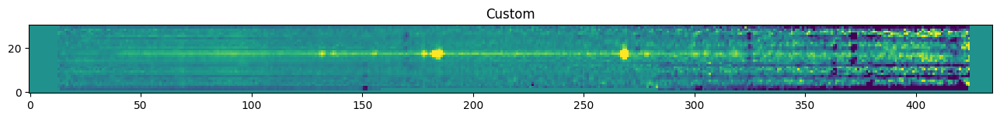

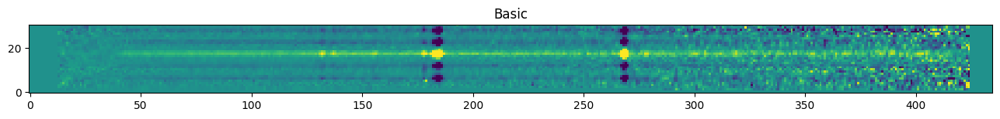

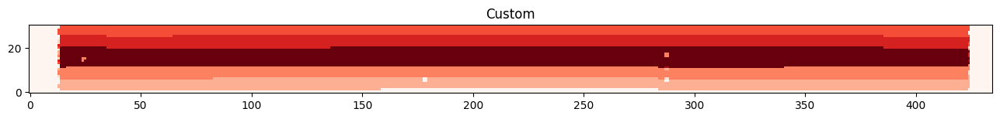

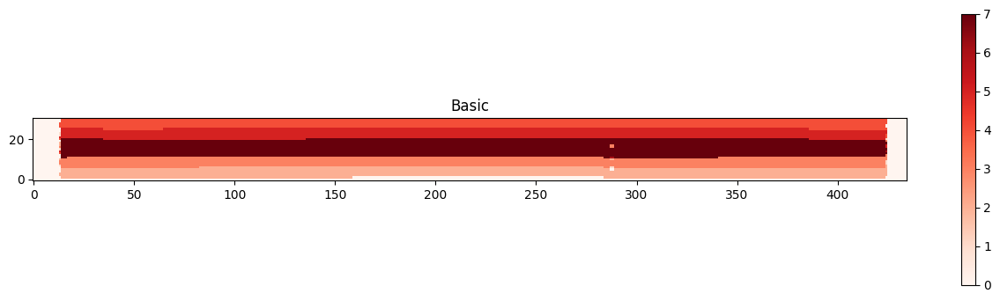

In [18]:
srcid = 1699
directory = "./mastDownload/JWST/CEERS-NIRSPEC-P5-PRISM-MSATA/"
with fits.open(directory + f"Final/jw01345-o063_s0{str(srcid).zfill(4)}_nirspec_clear-prism_s2d.fits") as _:
    custom = _[1].data
    con1 = _[4].data

with fits.open(directory+f"Mast/jw01345-o063_s0{str(srcid).zfill(4)}_nirspec_clear-prism_s2d.fits") as _:
    mast = _[1].data
    con2 = _[4].data
    
plt.figure(figsize=(16,4))
z = ZScaleInterval()
z1,z2 = z.get_limits(custom)
plt.imshow(custom,origin='lower',interpolation='none',vmin=z1,vmax=z2)
plt.title("Custom")
plt.figure(figsize=(16,4))
z = ZScaleInterval()
z1,z2 = z.get_limits(custom)
plt.imshow(mast,origin='lower',interpolation='none',vmin=z1,vmax=z2)
plt.title("Basic")
plt.show()

plt.figure(figsize=(16,4))
plt.imshow(con1[0,:,:],origin='lower',interpolation='none',cmap="Reds")
plt.title("Custom")
plt.figure(figsize=(16,4))
plt.imshow(con2[0,:,:],origin='lower',interpolation='none',cmap="Reds")
plt.colorbar()
plt.title("Basic")
plt.show()


# Comparison between background, raw and treated

SUBTRACTED


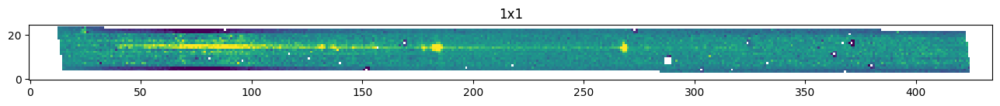

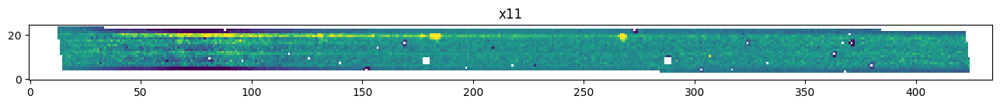

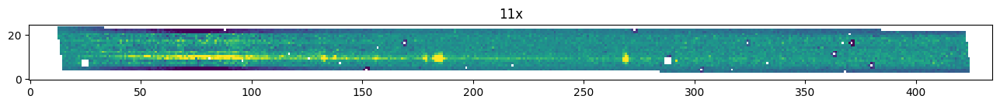

FIT


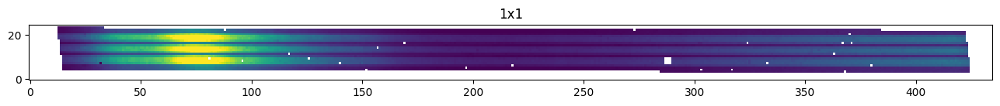

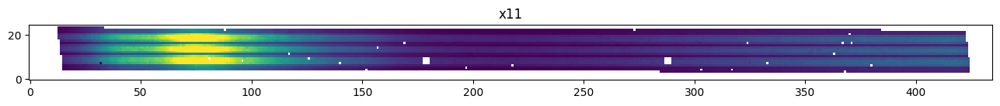

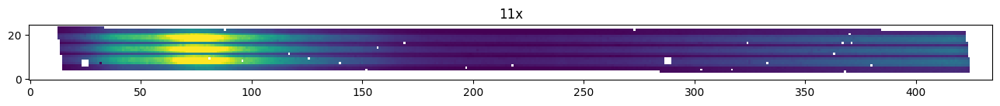

RAW


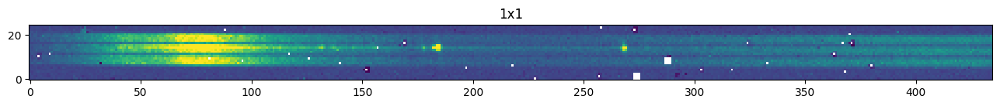

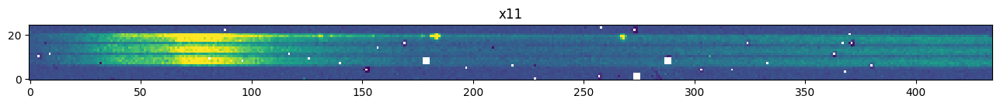

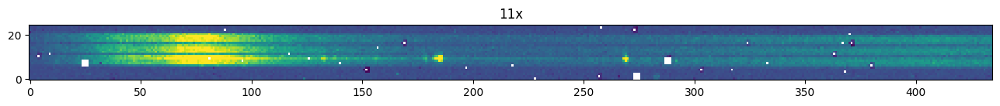

DEFAULT


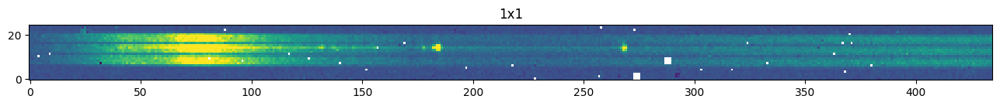

In [20]:
print("SUBTRACTED")
for bkg in glob(directory+"*_bkg.fits"):
    with fits.open(bkg) as _:
        for i,hdu in enumerate(_):
            if hdu.name != "SCI":
                continue
            if hdu.header["SOURCEID"] != srcid:
                continue
            plt.figure(figsize=(16,4))
            z = ZScaleInterval()
            z1,z2 = z.get_limits(hdu.data)
            plt.imshow(hdu.data,origin='lower',interpolation='none',vmin=z1,vmax=z2)
            plt.title(hdu.header["SHUTSTA"])
            plt.show()
            
print("FIT")
for bkg in glob(directory+"*_background.fits"):
    with fits.open(bkg) as _:
        for i,hdu in enumerate(_):
            if hdu.name != "SCI":
                continue
            if hdu.header["SOURCEID"] != srcid:
                continue
            plt.figure(figsize=(16,4))
            z = ZScaleInterval()
            z1,z2 = z.get_limits(hdu.data)
            plt.imshow(hdu.data,origin='lower',interpolation='none',vmin=z1,vmax=z2)
            plt.title(hdu.header["SHUTSTA"])
            plt.show()
            
            
print("RAW")
for bkg in glob(directory+"*_srctype.fits"):
    with fits.open(bkg) as _:
        for i,hdu in enumerate(_):
            if hdu.name != "SCI":
                continue
            if hdu.header["SOURCEID"] != srcid:
                continue
            plt.figure(figsize=(16,4))
            z = ZScaleInterval()
            z1,z2 = z.get_limits(hdu.data)
            plt.imshow(hdu.data,origin='lower',interpolation='none',vmin=z1,vmax=z2)
            plt.title(hdu.header["SHUTSTA"])
            plt.show()
            
          
print("DEFAULT")
for bkg in glob("TestStage3/jw01345063001_03101_00001_nrs1_srctype_default.fits"):
    with fits.open(bkg) as _:
        for i,hdu in enumerate(_):
            if hdu.name != "SCI":
                continue
            if hdu.header["SOURCEID"] != srcid:
                continue
            plt.figure(figsize=(16,4))
            z = ZScaleInterval()
            #z1,z2 = z.get_limits(hdu.data)
            plt.imshow(hdu.data,origin='lower',interpolation='none',vmin=z1,vmax=z2)
            plt.title(hdu.header["SHUTSTA"])
            plt.show()
            
            

# Can a spline fit noisy data

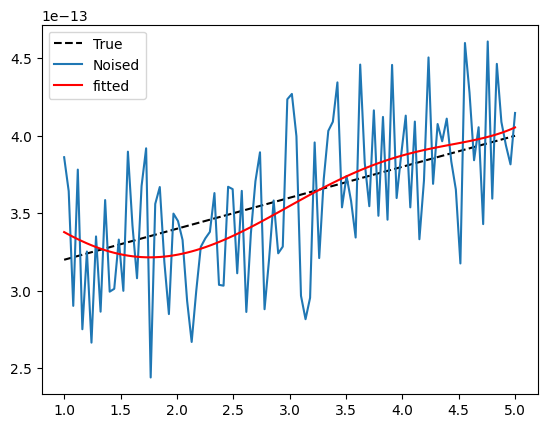

In [73]:
x = np.linspace(1,5,100)
y = (0.2*x + 3)*1e-13
dy = (np.random.normal(0,0.1,len(x)))*4*1e-13

plt.figure()
plt.plot(x,y,label='True',linestyle="dashed",color='k')
plt.plot(x,y+dy,label='Noised')

interp = interpolate.UnivariateSpline(x, y+dy, s=0.000000000000000000000001, k=5)
fitted = interp(x)
plt.plot(x,fitted,label="fitted",color='r')
plt.legend()
plt.show()